In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
# --- Runtime check ---
import torch

if torch.cuda.is_available():
    DEVICE = torch.device("cuda")
    print("✅ GPU runtime active")
    print("GPU Name:", torch.cuda.get_device_name(0))
else:
    DEVICE = torch.device("cpu")
    print("❌ Running on CPU only")


✅ GPU runtime active
GPU Name: Tesla T4


In [ ]:
import os

print("Contents of MyDrive:")
# Check if the directory exists before trying to list its contents
if os.path.exists("/content/drive/MyDrive"):
    print(os.listdir("/content/drive/MyDrive"))
else:
    print("Google Drive MyDrive directory not found. Please ensure Google Drive is mounted correctly.")

Contents of MyDrive:
['AI TraceFinder.ipynb', 'Colab Notebooks', 'AI_TraceFinder']


In [ ]:
import os

# Base dataset path in Drive
base_path = "/content/drive/MyDrive/AI_TraceFinder"

# Show all top-level folders inside AI_TraceFinder
print("Main Dataset Folders:")
for folder in os.listdir(base_path):
    print(" -", folder)

# Check inside each category
categories = ["Flatfield", "Official", "Wikipedia", "Tampered images"]

for category in categories:
    category_path = os.path.join(base_path, category)
    if os.path.isdir(category_path):
        print(f"\n=== {category} ===")
        for scanner in os.listdir(category_path):
            print(" 🔹 Scanner:", scanner)

Main Dataset Folders:
 - Flatfield
 - Originals
 - Official
 - Wikipedia
 - Tampered images

=== Flatfield ===
 🔹 Scanner: Canon120-1
 🔹 Scanner: EpsonV39-1
 🔹 Scanner: Canon120-2
 🔹 Scanner: Canon220
 🔹 Scanner: HP
 🔹 Scanner: EpsonV370-2
 🔹 Scanner: EpsonV39-2
 🔹 Scanner: Canon9000-1
 🔹 Scanner: EpsonV550
 🔹 Scanner: EpsonV370-1
 🔹 Scanner: Canon9000-2

=== Official ===
 🔹 Scanner: Canon120-1
 🔹 Scanner: Canon220
 🔹 Scanner: EpsonV370-2
 🔹 Scanner: EpsonV370-1
 🔹 Scanner: Canon9000-2
 🔹 Scanner: Canon120-2
 🔹 Scanner: HP
 🔹 Scanner: EpsonV39-2
 🔹 Scanner: EpsonV550
 🔹 Scanner: Canon9000-1
 🔹 Scanner: EpsonV39-1

=== Wikipedia ===
 🔹 Scanner: EpsonV39-2
 🔹 Scanner: EpsonV550
 🔹 Scanner: EpsonV370-1
 🔹 Scanner: EpsonV39-1
 🔹 Scanner: Canon120-1
 🔹 Scanner: Canon120-2
 🔹 Scanner: Canon220
 🔹 Scanner: Canon9000-1
 🔹 Scanner: Canon9000-2
 🔹 Scanner: EpsonV370-2
 🔹 Scanner: HP

=== Tampered images ===
 🔹 Scanner: Binary masks
 🔹 Scanner: Description
 🔹 Scanner: Original
 🔹 Scanner: Tampere

In [ ]:
import os
from google.colab import drive

# Mount Google Drive (if not already mounted)
drive.mount('/content/drive', force_remount=False)

main_counts = {}  # dictionary to store counts per main folder

def print_tree_counts(path, indent="", top_level=None):
    global main_counts
    items = sorted(os.listdir(path))
    file_count = sum([1 for i in items if os.path.isfile(os.path.join(path, i))])
    print(f"{indent} {os.path.basename(path)}/ ({file_count} files)")

    # track counts for top-level main folders
    if top_level is not None:
        main_counts[top_level] = main_counts.get(top_level, 0) + file_count

    for item in items:
        item_path = os.path.join(path, item)
        if os.path.isdir(item_path):
            # pass top_level = current main folder
            if indent == "":  # first level (Flatfield, Official, etc.)
                print_tree_counts(item_path, indent + "    ", top_level=item)
            else:
                print_tree_counts(item_path, indent + "    ", top_level=top_level)

# ---- Run on your dataset ----
dataset_path = "/content/drive/MyDrive/AI_TraceFinder"
print_tree_counts(dataset_path)

# ---- Print main folder totals ----
print("\n Total files per main folder:")
for folder, count in main_counts.items():
    print(f"   {folder}: {count} files")

print(f"\n Grand Total: {sum(main_counts.values())} files")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
 AI_TraceFinder/ (0 files)
     Flatfield/ (0 files)
         Canon120-1/ (2 files)
         Canon120-2/ (2 files)
         Canon220/ (2 files)
         Canon9000-1/ (2 files)
         Canon9000-2/ (2 files)
         EpsonV370-1/ (2 files)
         EpsonV370-2/ (2 files)
         EpsonV39-1/ (3 files)
         EpsonV39-2/ (2 files)
         EpsonV550/ (2 files)
         HP/ (2 files)
     Official/ (0 files)
         Canon120-1/ (0 files)
             150/ (100 files)
             300/ (100 files)
         Canon120-2/ (0 files)
             150/ (100 files)
             300/ (100 files)
         Canon220/ (0 files)
             150/ (100 files)
             300/ (100 files)
         Canon9000-1/ (0 files)
             150/ (100 files)
             300/ (100 files)
         Canon9000-2/ (0 files)
             150/ (100 files)
             300/ (100 files)
    

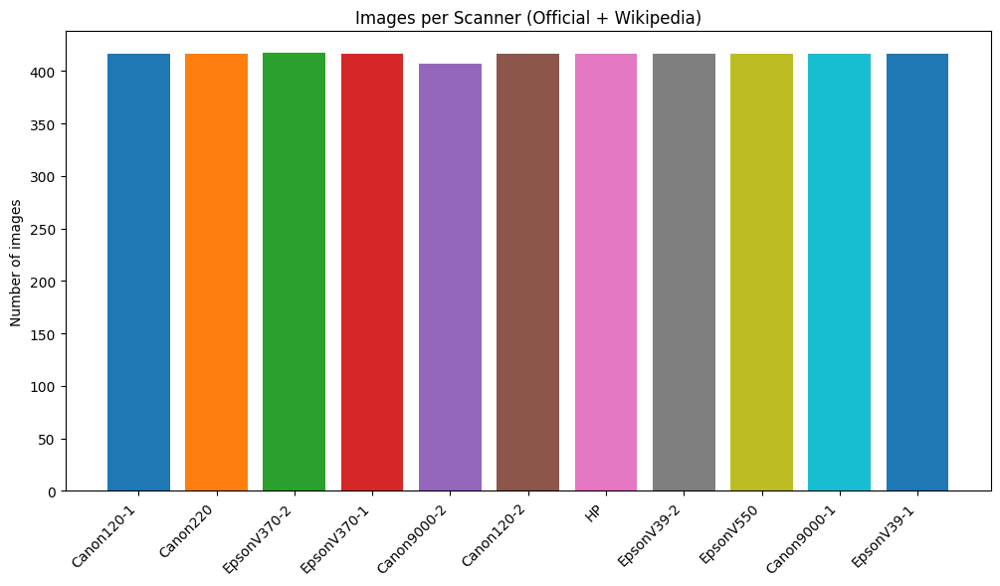

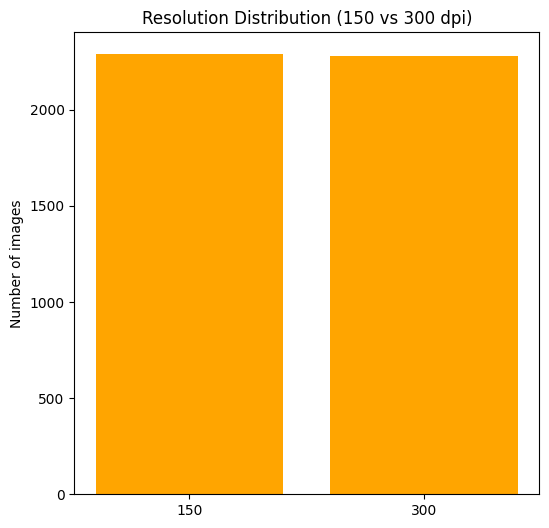

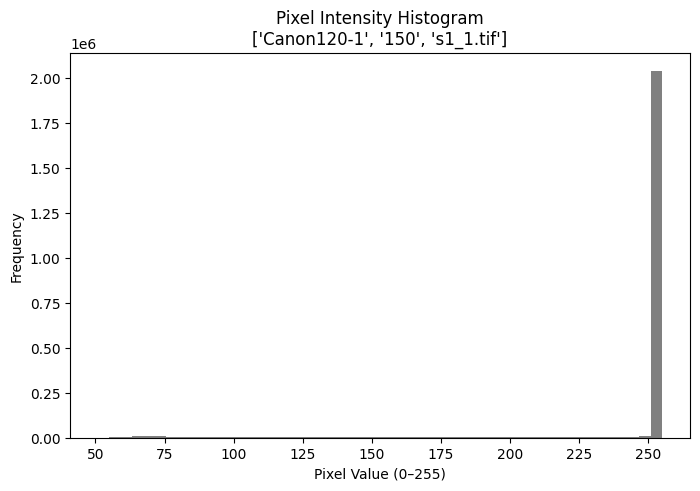

In [ ]:
import os
import matplotlib.pyplot as plt
import cv2
import numpy as np
from collections import defaultdict

# Base path
base_path = "/content/drive/MyDrive/AI_TraceFinder"

# Function to count images per scanner per resolution
def count_images(base, categories=("Official", "Wikipedia")):
    counts = defaultdict(lambda: defaultdict(int))  # scanner -> {res: count}
    for cat in categories:
        cat_path = os.path.join(base, cat)
        for scanner in os.listdir(cat_path):
            scan_path = os.path.join(cat_path, scanner)
            if os.path.isdir(scan_path):
                for res in os.listdir(scan_path):
                    res_path = os.path.join(scan_path, res)
                    if os.path.isdir(res_path):
                        n = len([f for f in os.listdir(res_path) if f.lower().endswith(('.jpg','.png','.tif','.tiff'))])
                        counts[scanner][res] += n
    return counts

# Get counts
scanner_counts = count_images(base_path)

# --- Plot 1: Bar chart per scanner ---
plt.figure(figsize=(12,6))
for scanner, res_dict in scanner_counts.items():
    total = sum(res_dict.values())
    plt.bar(scanner, total)
plt.xticks(rotation=45, ha="right")
plt.ylabel("Number of images")
plt.title("Images per Scanner (Official + Wikipedia)")
plt.show()

# --- Plot 2: Resolution distribution ---
res_totals = defaultdict(int)
for scanner, res_dict in scanner_counts.items():
    for res, cnt in res_dict.items():
        res_totals[res] += cnt

plt.figure(figsize=(6,6))
plt.bar(res_totals.keys(), res_totals.values(), color='orange')
plt.ylabel("Number of images")
plt.title("Resolution Distribution (150 vs 300 dpi)")
plt.show()

# --- Plot 3: Pixel intensity histogram for one sample ---
sample_img_path = None
for cat in ["Official", "Wikipedia"]:
    cat_path = os.path.join(base_path, cat)
    for scanner in os.listdir(cat_path):
        scan_path = os.path.join(cat_path, scanner)
        if os.path.isdir(scan_path):
            for res in os.listdir(scan_path):
                res_path = os.path.join(scan_path, res)
                if os.path.isdir(res_path):
                    files = [f for f in os.listdir(res_path) if f.lower().endswith(('.jpg','.png','.tif','.tiff'))]
                    if files:
                        sample_img_path = os.path.join(res_path, files[0])
                        break
            if sample_img_path:
                break
    if sample_img_path:
        break

if sample_img_path:
    img = cv2.imread(sample_img_path, cv2.IMREAD_GRAYSCALE)
    plt.figure(figsize=(8,5))
    plt.hist(img.ravel(), bins=50, color='gray')
    plt.title(f"Pixel Intensity Histogram\n{sample_img_path.split('/')[-3:]}")  # scanner/res/file
    plt.xlabel("Pixel Value (0–255)")
    plt.ylabel("Frequency")
    plt.show()

In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed

# Paths
BASE = "/content/drive/MyDrive/AI_TraceFinder"
OUT  = "/content/drive/MyDrive/AI_TraceFinder_Preprocessed"

# Parameters
SIZE = 224             # resize size
WORKERS = 8             # increase workers for speed
MAX_FILES = None        # limit per folder (None = all)

# Ensure output folder exists
os.makedirs(OUT, exist_ok=True)

def is_image(name):
    return name.lower().endswith((".tif",".tiff",".png",".jpg",".jpeg"))

def process_and_save(src, dst, cat):
    """Load, preprocess, and save one image"""
    img = cv2.imread(src, cv2.IMREAD_GRAYSCALE)
    if img is None:
        return False

    if cat == "Flatfield":
        processed = img   # keep original for PRNU
    else:
        # Resize and convert to uint8 for other categories
        processed = cv2.resize(img, (SIZE, SIZE), interpolation=cv2.INTER_AREA)
        processed = cv2.normalize(processed, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)


    os.makedirs(os.path.dirname(dst), exist_ok=True)
    cv2.imwrite(dst, processed)
    return True

def preprocess_category(cat):
    cat_in = os.path.join(BASE, cat)
    cat_out = os.path.join(OUT, cat)
    if not os.path.isdir(cat_in):
        print(f" Missing: {cat}")
        return

    print(f"\n=== Processing {cat} ===")
    futures = []
    with ThreadPoolExecutor(max_workers=WORKERS) as executor:
        for root, _, files in os.walk(cat_in):
            img_files = [f for f in files if is_image(f)]
            if MAX_FILES:
                img_files = img_files[:MAX_FILES]
            for fname in img_files:
                src = os.path.join(root, fname)
                rel = os.path.relpath(src, cat_in)
                dst = os.path.join(cat_out, rel)
                futures.append(executor.submit(process_and_save, src, dst, cat))

        for _ in tqdm(as_completed(futures), total=len(futures), desc=f"{cat}"):
            pass
    print(f" Done {cat}")

# Run all categories
for cat in ["Flatfield", "Official", "Wikipedia", "Tampered images"]:
    preprocess_category(cat)

print("\n FAST preprocessing complete! Check:", OUT)


=== Processing Flatfield ===


Flatfield: 100%|██████████| 23/23 [00:13<00:00,  1.76it/s]


 Done Flatfield

=== Processing Official ===


Official: 100%|██████████| 2200/2200 [17:58<00:00,  2.04it/s]


 Done Official

=== Processing Wikipedia ===


Wikipedia: 100%|██████████| 2368/2368 [19:34<00:00,  2.02it/s]


 Done Wikipedia

=== Processing Tampered images ===


Tampered images: 100%|██████████| 271/271 [01:51<00:00,  2.44it/s]

 Done Tampered images

 FAST preprocessing complete! Check: /content/drive/MyDrive/AI_TraceFinder_Preprocessed


 Built fingerprint for scanner: Canon120-1
 Built fingerprint for scanner: EpsonV39-1
 Built fingerprint for scanner: Canon220
 Built fingerprint for scanner: EpsonV370-2
 Built fingerprint for scanner: Canon120-2
 Built fingerprint for scanner: HP
 Built fingerprint for scanner: EpsonV39-2
 Built fingerprint for scanner: Canon9000-1
 Built fingerprint for scanner: EpsonV550
 Built fingerprint for scanner: Canon9000-2
 Built fingerprint for scanner: EpsonV370-1
 Saved fingerprints dictionary to: /content/drive/MyDrive/AI_TraceFinder_fingerprints.npy


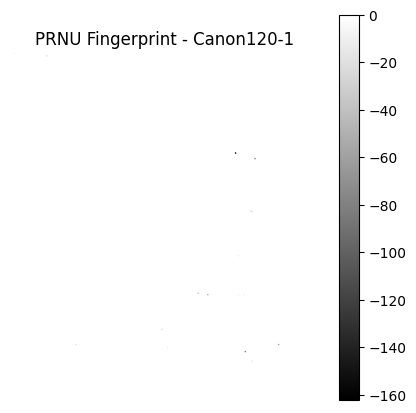

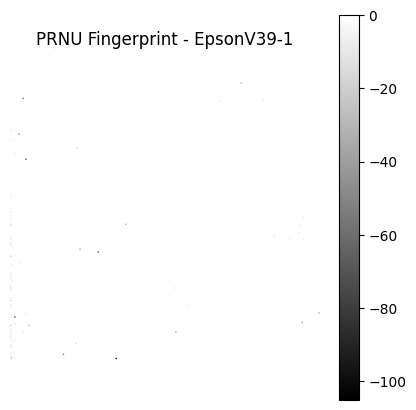

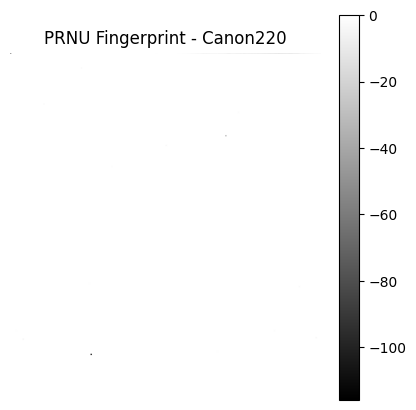

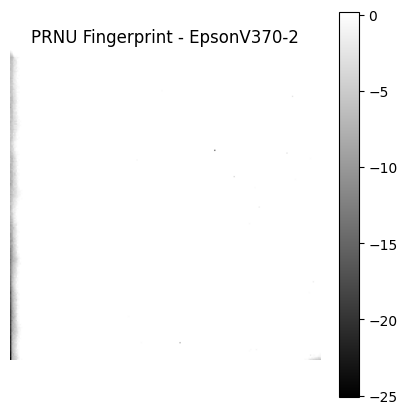

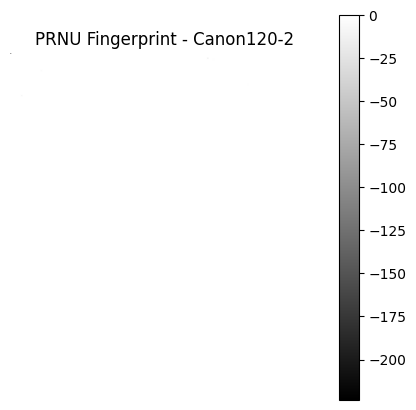

...

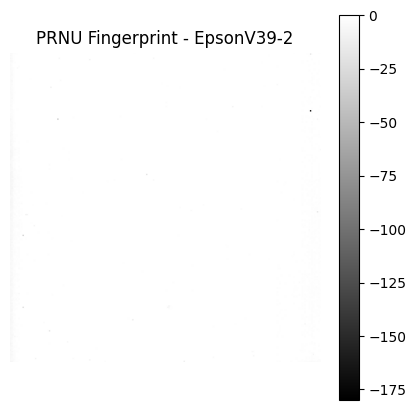

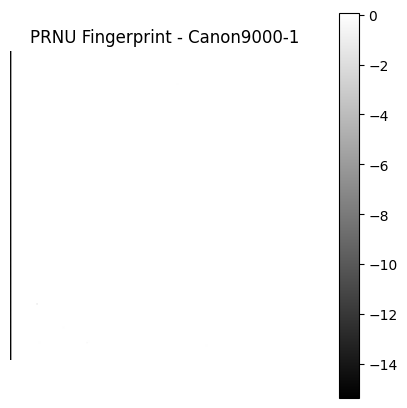

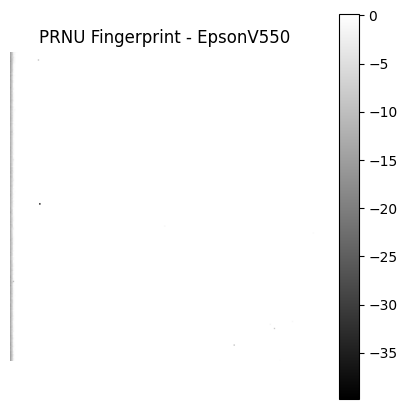

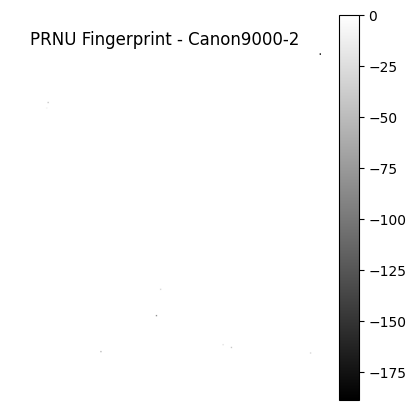

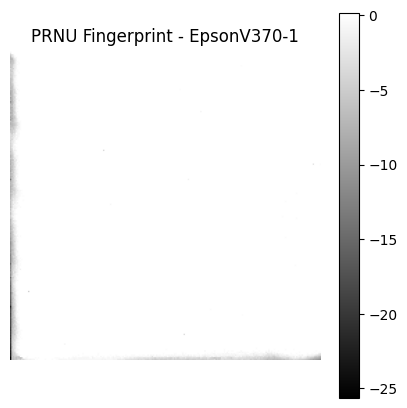


 Fingerprints built for scanners: ['Canon120-1', 'EpsonV39-1', 'Canon220', 'EpsonV370-2', 'Canon120-2', 'HP', 'EpsonV39-2', 'Canon9000-1', 'EpsonV550', 'Canon9000-2', 'EpsonV370-1']


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.restoration import denoise_wavelet

# Paths
PREPROCESSED = "/content/drive/MyDrive/AI_TraceFinder_Preprocessed"
SIZE = 224  # resize size (match your preprocessing)
FINGERPRINTS_SAVE_PATH = "/content/drive/MyDrive/AI_TraceFinder_fingerprints.npy" # Define the save path

# --- Residual extractor ---
def extract_residual(img):
    """Extract PRNU residual = image - denoised(image)."""
    den = denoise_wavelet(img, channel_axis=None, mode='soft', rescale_sigma=True)
    resid = img - den
    resid = resid - resid.mean()
    resid = resid / (resid.std() + 1e-8)
    return resid.astype(np.float32)

# --- Build PRNU fingerprints from Flatfield ---
fingerprints = {}
flatfield_path = os.path.join(PREPROCESSED, "Flatfield")

for scanner in os.listdir(flatfield_path):
    scanner_dir = os.path.join(flatfield_path, scanner)
    if not os.path.isdir(scanner_dir):
        continue

    residuals = []
    for fname in os.listdir(scanner_dir):
        if fname.lower().endswith((".tif", ".tiff", ".png", ".jpg", ".jpeg")):
            img = cv2.imread(os.path.join(scanner_dir, fname), cv2.IMREAD_GRAYSCALE)
            if img is None:
                continue
            img = cv2.resize(img, (SIZE, SIZE))
            resid = extract_residual(img)
            residuals.append(resid)

    if residuals:
        # Average residuals = PRNU fingerprint
        fingerprint = np.mean(residuals, axis=0)
        # Normalize
        fingerprint = (fingerprint - fingerprint.mean()) / (fingerprint.std() + 1e-8)
        fingerprints[scanner] = fingerprint
        np.save(os.path.join(PREPROCESSED, f"fingerprint_{scanner}.npy"), fingerprint)
        print(f" Built fingerprint for scanner: {scanner}")

# Save the entire fingerprints dictionary as an .npy file
np.save(FINGERPRINTS_SAVE_PATH, fingerprints)
print(f" Saved fingerprints dictionary to: {FINGERPRINTS_SAVE_PATH}")

# This block was incorrectly indented
for scanner, fp in fingerprints.items():
    plt.figure(figsize=(5,5))
    plt.imshow(fp, cmap="gray")
    plt.title(f"PRNU Fingerprint - {scanner}")
    plt.axis("off")
    plt.colorbar()
    plt.show()


print("\n Fingerprints built for scanners:", list(fingerprints.keys()))


=== Extracting PRNU for Flatfield ===


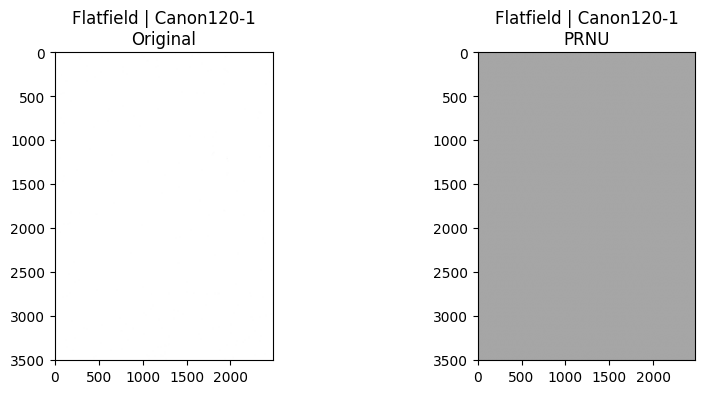

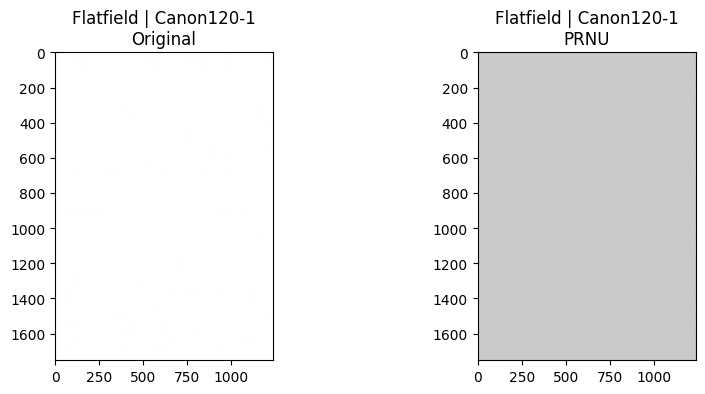

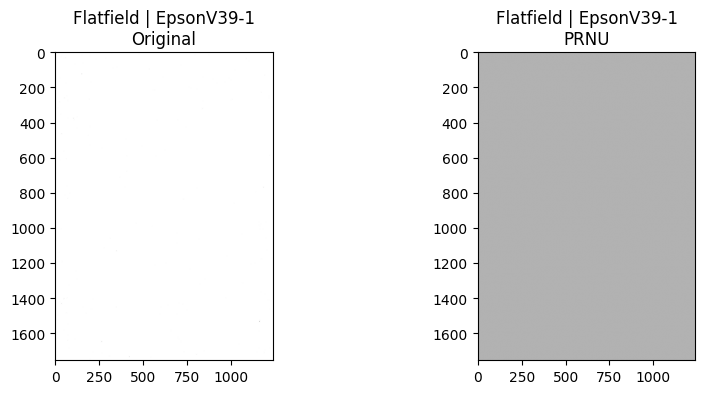

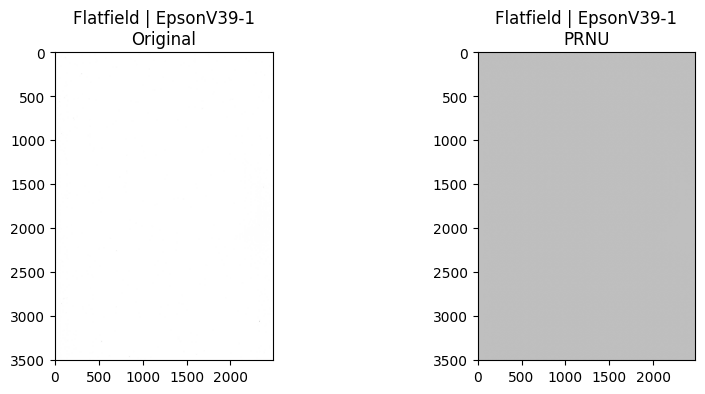

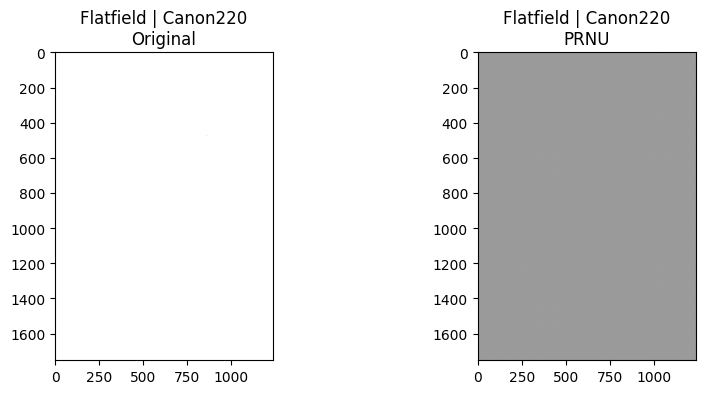

...

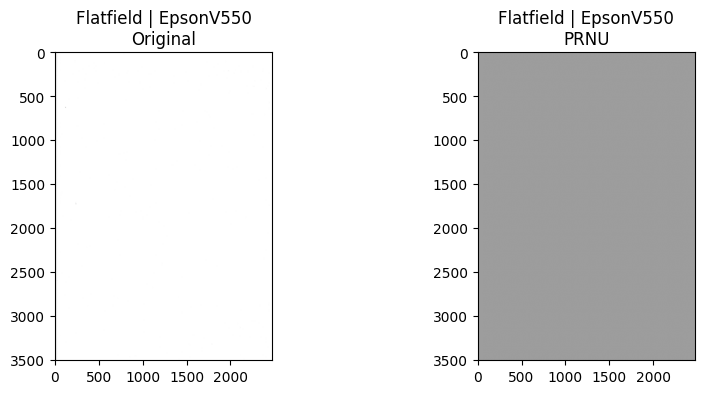

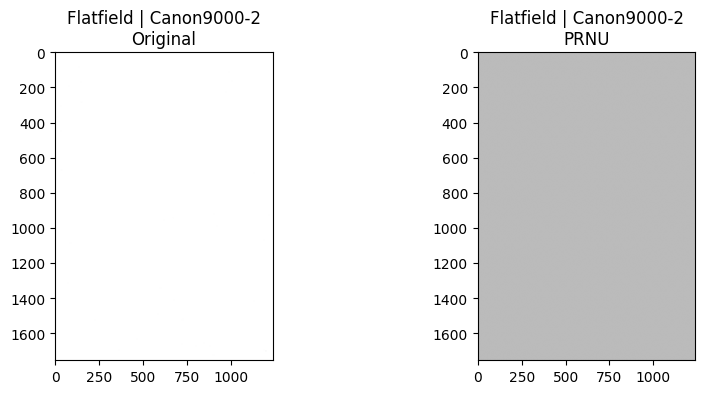

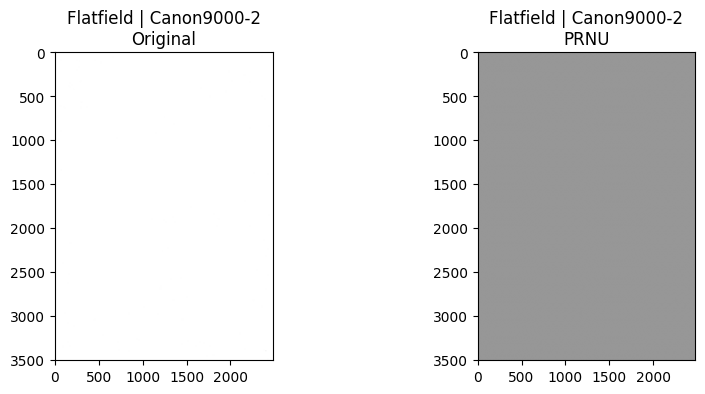

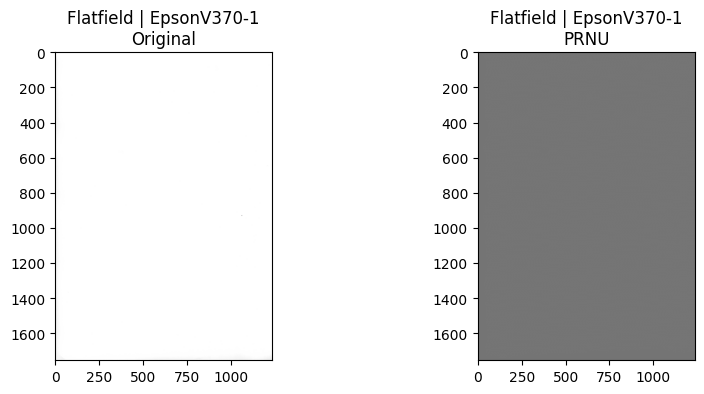

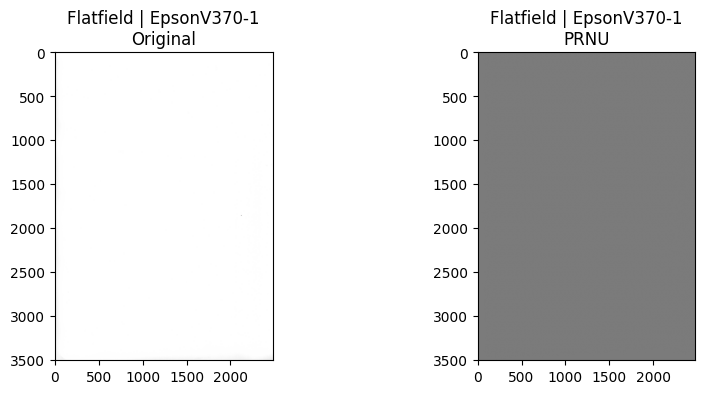


=== Extracting PRNU for Official ===


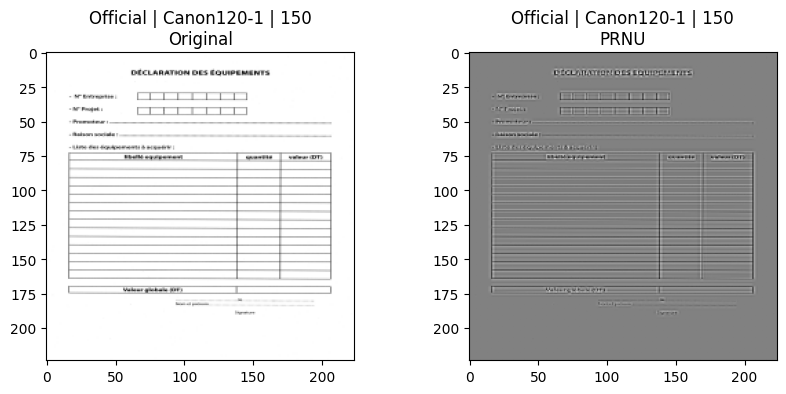

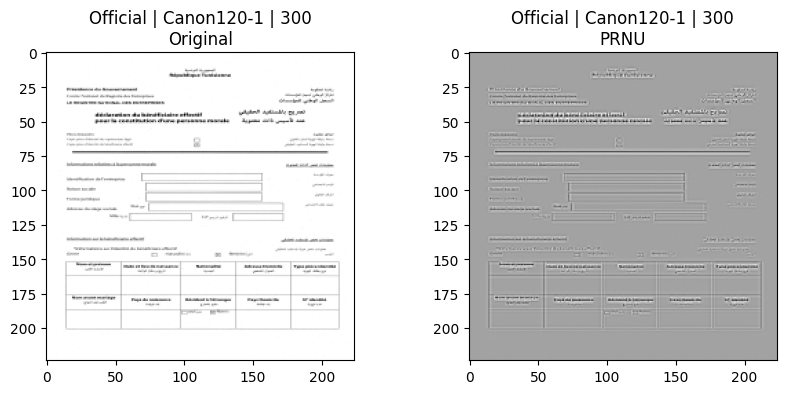

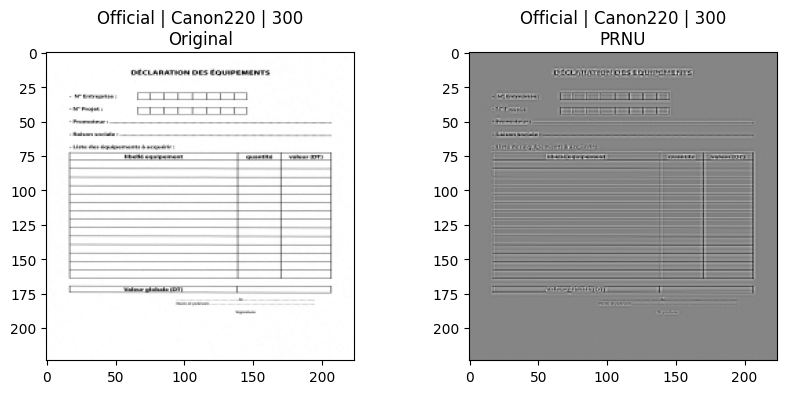

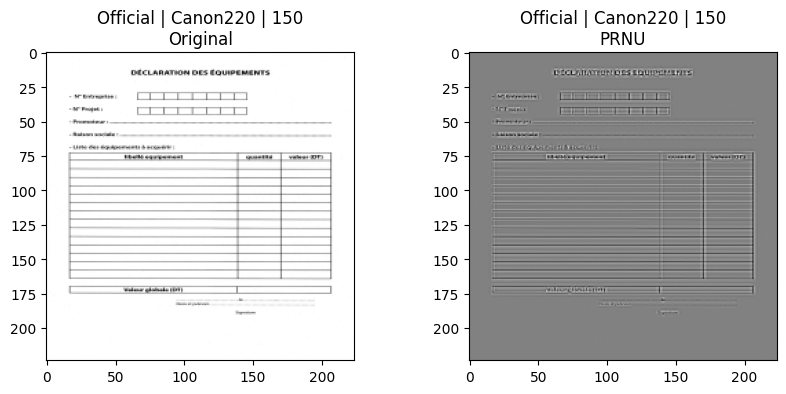

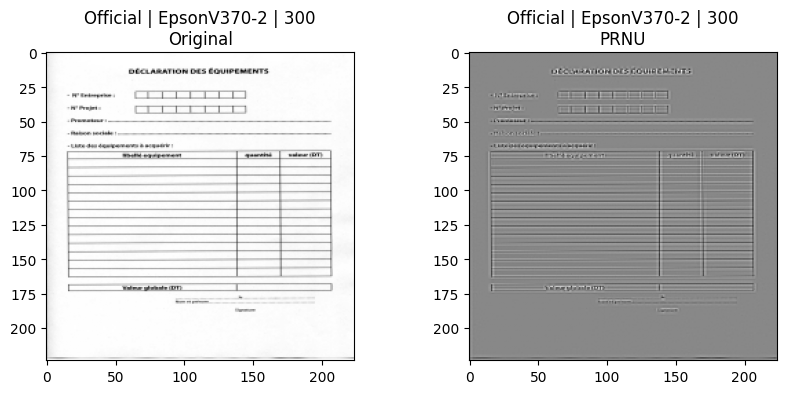

...

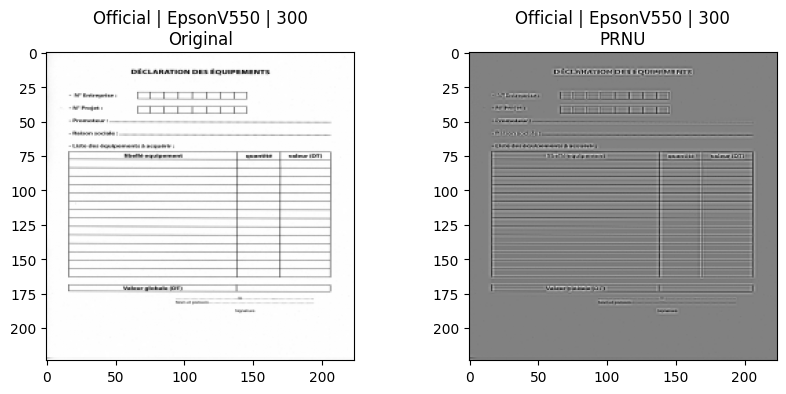

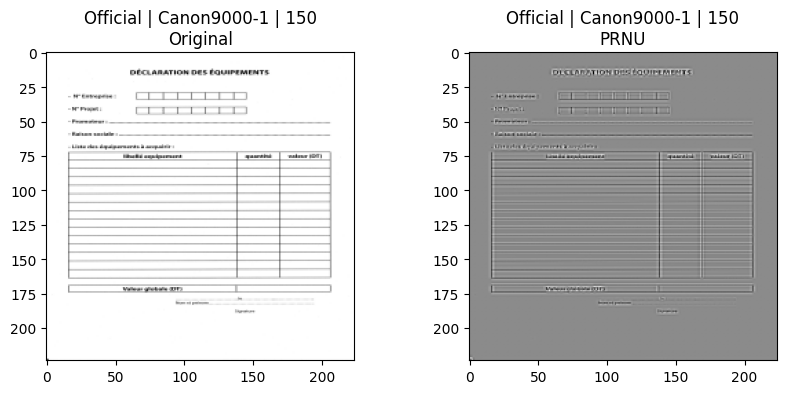

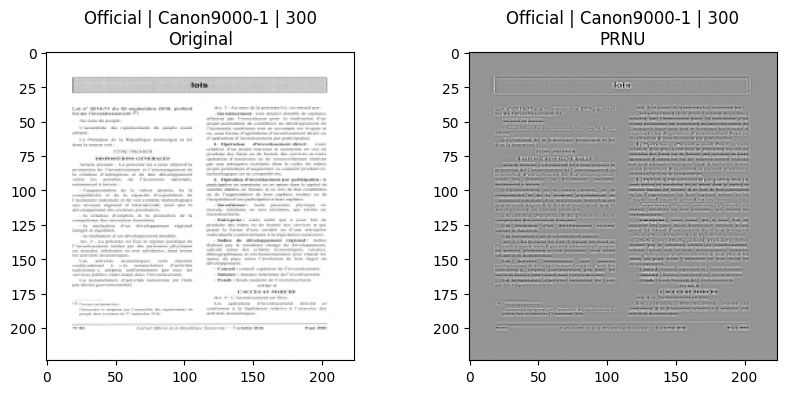

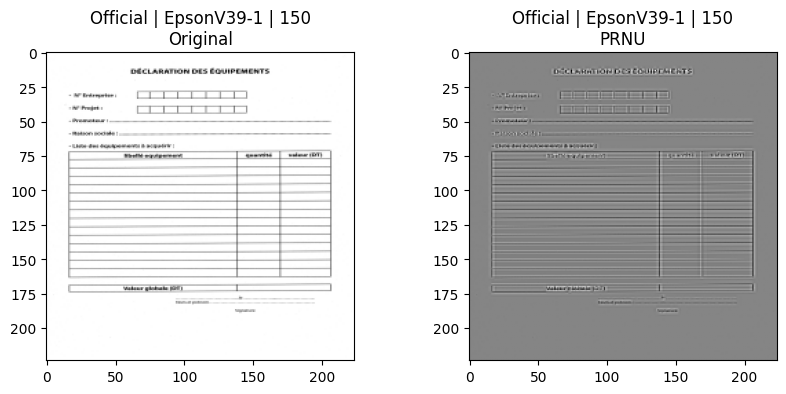

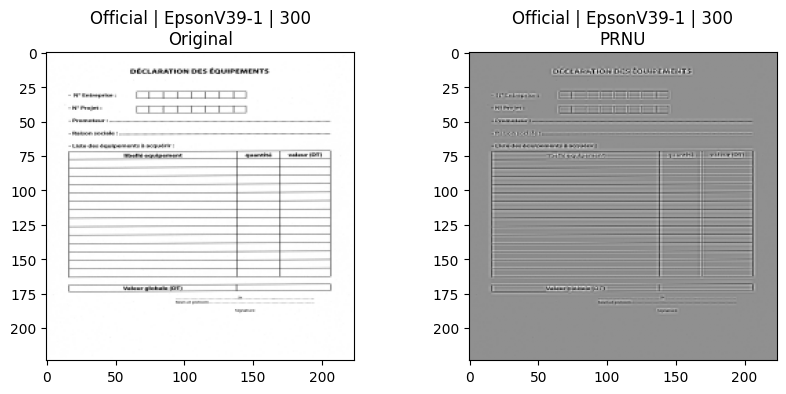


=== Extracting PRNU for Wikipedia ===


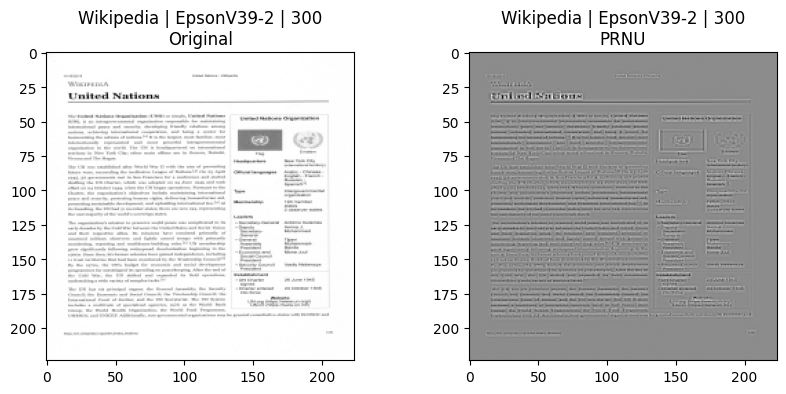

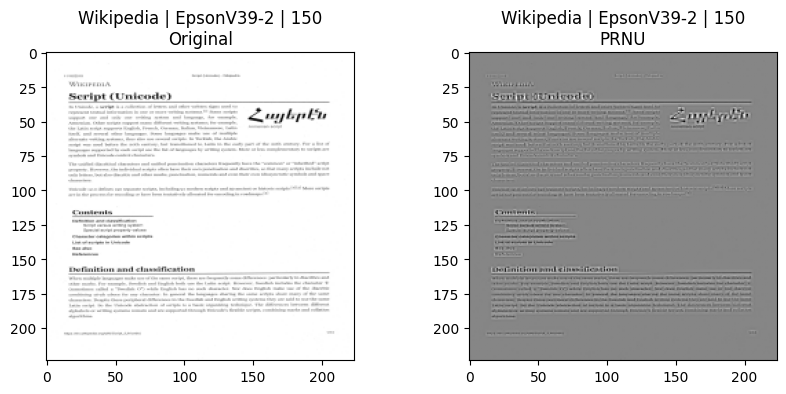

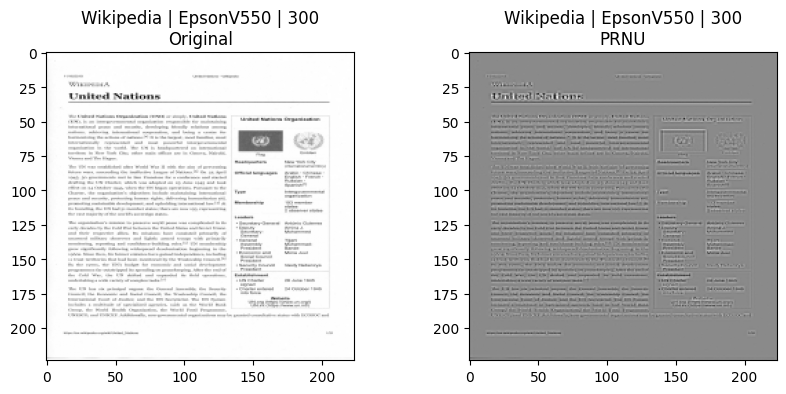

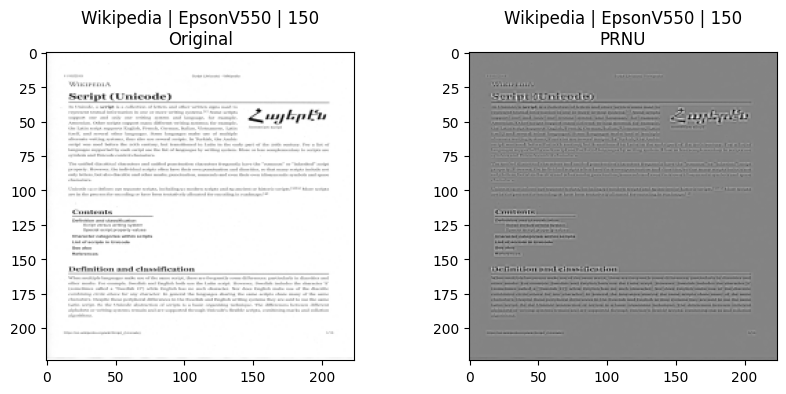

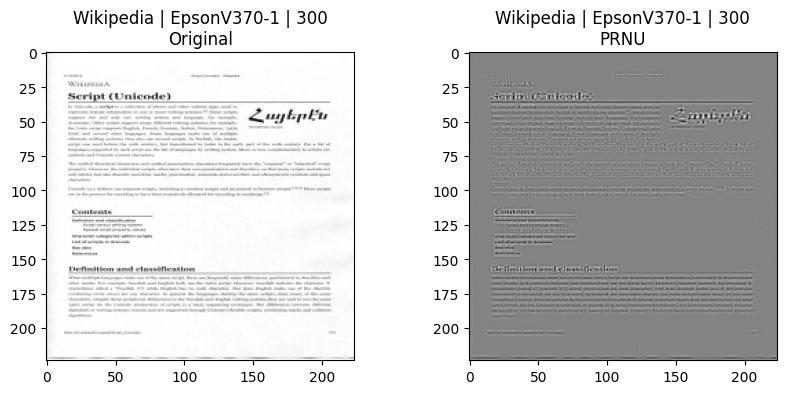

...

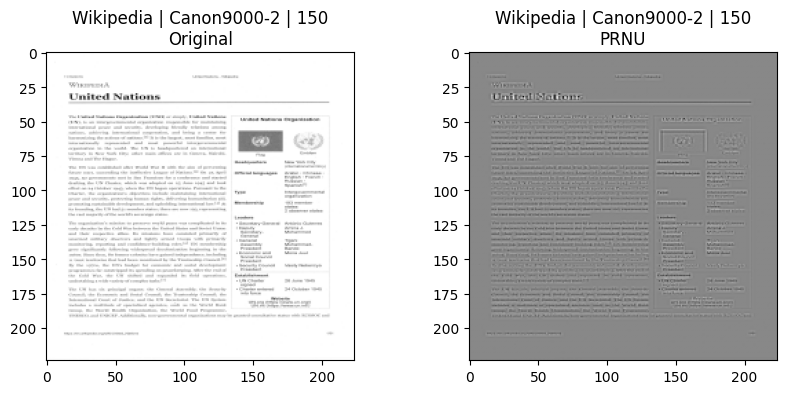

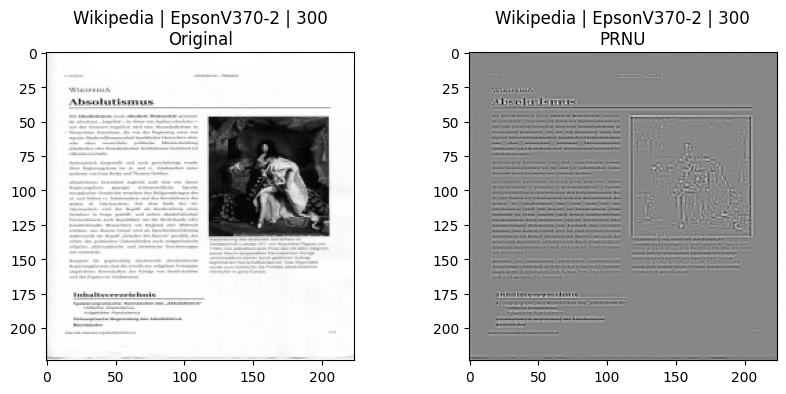

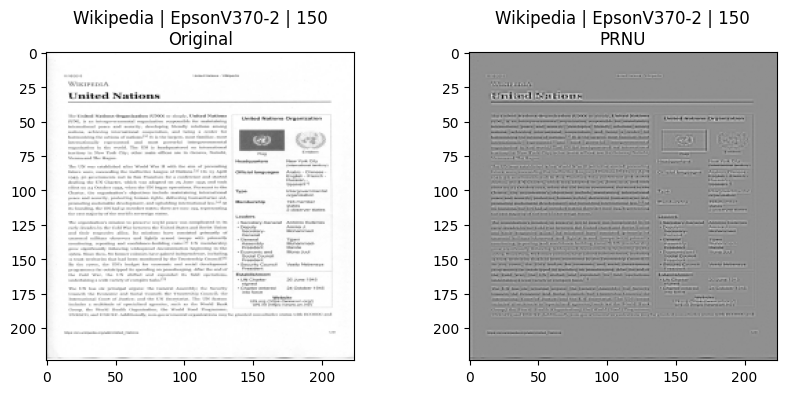

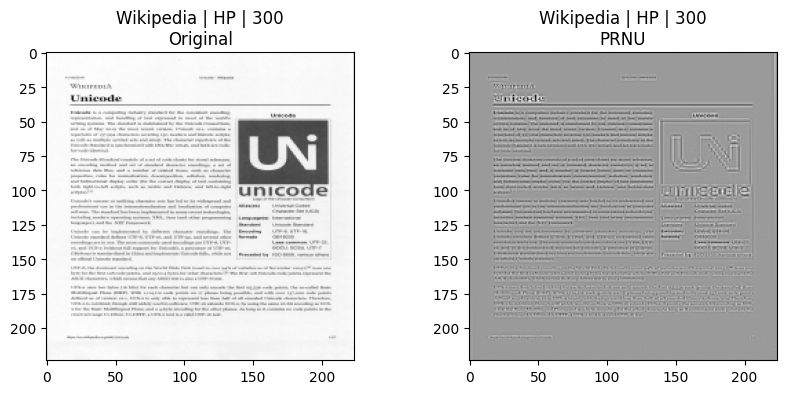

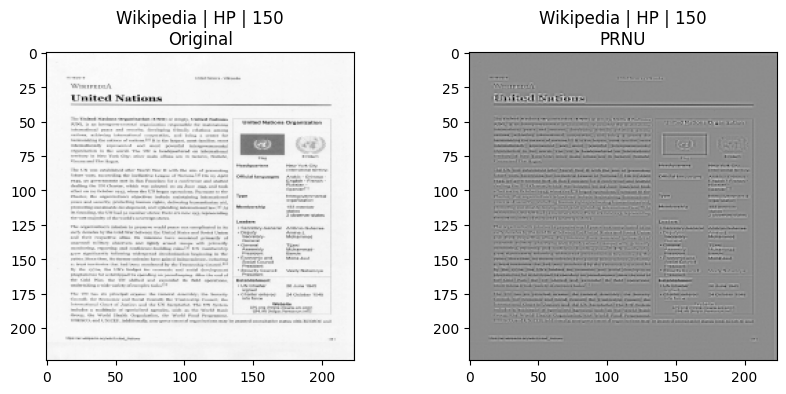

In [ ]:
import os
import cv2
import numpy as np
import pywt
import matplotlib.pyplot as plt

# === Paths ===
base_path = "/content/drive/MyDrive/AI_TraceFinder_Preprocessed"
output_path = "/content/drive/MyDrive/AI_TraceFinder_PRNU"
os.makedirs(output_path, exist_ok=True)

def extract_prnu(img):
    """Extract PRNU fingerprint using wavelet denoising residual."""
    coeffs = pywt.dwt2(img, 'db2')
    cA, (cH, cV, cD) = coeffs
    cA.fill(0)  # keep only noise details
    residual = pywt.idwt2((cA, (cH, cV, cD)), 'db2')
    return residual

# Process categories
for category in ["Flatfield", "Official", "Wikipedia"]:
    cat_in = os.path.join(base_path, category)
    if not os.path.isdir(cat_in):
        print(f" Skipping missing category: {category}")
        continue

    print(f"\n=== Extracting PRNU for {category} ===")
    for scanner in os.listdir(cat_in):
        scanner_path = os.path.join(cat_in, scanner)
        if not os.path.isdir(scanner_path):
            continue

        for sub in os.listdir(scanner_path):  # DPI folders
            sub_path = os.path.join(scanner_path, sub)
            if os.path.isdir(sub_path):
                out_dir = os.path.join(output_path, category, scanner, sub)
                os.makedirs(out_dir, exist_ok=True)

                shown_example = False
                for file in os.listdir(sub_path):
                    if file.lower().endswith(('.tif', '.tiff', '.jpg', '.png')):
                        img_path = os.path.join(sub_path, file)
                        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                        if img is None:
                            continue

                        # Extract PRNU
                        residual = extract_prnu(img)
                        residual = (residual - residual.mean()) / (residual.std() + 1e-12)

                        # Save as .npy (for ML)
                        base = os.path.splitext(file)[0]
                        np.save(os.path.join(out_dir, f"{base}_prnu.npy"), residual.astype(np.float32))

                        # Save normalized .png (for preview)
                        residual_norm = cv2.normalize(residual, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
                        cv2.imwrite(os.path.join(out_dir, f"{base}_prnu.png"), residual_norm)

                        # Show one example in Colab
                        if not shown_example:
                            plt.figure(figsize=(10,4))
                            plt.subplot(1,2,1); plt.imshow(img, cmap='gray'); plt.title(f"{category} | {scanner} | {sub}\nOriginal")
                            plt.subplot(1,2,2); plt.imshow(residual_norm, cmap='gray'); plt.title(f"{category} | {scanner} | {sub}\nPRNU")
                            plt.show()
                            shown_example = True

            # Handle Flatfield files directly (if no dpi folder)
            elif category == "Flatfield" and sub.lower().endswith(('.tif', '.tiff', '.jpg', '.png')):
                img_path = os.path.join(scanner_path, sub)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                if img is None:
                    continue

                residual = extract_prnu(img)
                residual = (residual - residual.mean()) / (residual.std() + 1e-12)

                # Save both .npy and .png
                out_dir = os.path.join(output_path, category, scanner)
                os.makedirs(out_dir, exist_ok=True)
                base = os.path.splitext(sub)[0]
                np.save(os.path.join(out_dir, f"{base}_prnu.npy"), residual.astype(np.float32))
                residual_norm = cv2.normalize(residual, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
                cv2.imwrite(os.path.join(out_dir, f"{base}_prnu.png"), residual_norm)

                # Show preview
                plt.figure(figsize=(10,4))
                plt.subplot(1,2,1); plt.imshow(img, cmap='gray'); plt.title(f"{category} | {scanner}\nOriginal")
                plt.subplot(1,2,2); plt.imshow(residual_norm, cmap='gray'); plt.title(f"{category} | {scanner}\nPRNU")
                plt.show()

In [ ]:
import os
import cv2
import numpy as np
import pywt
from tqdm import tqdm

# Paths
base_path = "/content/drive/MyDrive/AI_TraceFinder_Preprocessed"
output_path = "/content/drive/MyDrive/AI_TraceFinder_PRNU"
os.makedirs(output_path, exist_ok=True)

def extract_prnu(img):
    coeffs = pywt.dwt2(img, 'db2')
    cA, (cH, cV, cD) = coeffs
    cA.fill(0)
    residual = pywt.idwt2((cA, (cH, cV, cD)), 'db2')
    residual = (residual - residual.mean()) / (residual.std() + 1e-12)
    return residual.astype(np.float32)

for category in ["Official", "Wikipedia"]:
    cat_in = os.path.join(base_path, category)
    if not os.path.isdir(cat_in):
        print(f"⚠️ Skipping missing {category}")
        continue

    for scanner in os.listdir(cat_in):
        scanner_path = os.path.join(cat_in, scanner)
        if not os.path.isdir(scanner_path): continue

        out_dir = os.path.join(output_path, category, scanner)
        os.makedirs(out_dir, exist_ok=True)

        for fname in tqdm(os.listdir(scanner_path), desc=f"{category}/{scanner}"):
            if fname.lower().endswith((".tif", ".tiff", ".jpg", ".png", ".jpeg")):
                # Rest of the processing logic for each file would go here
                pass # Added a pass statement to make the code syntactically correct for now.

Wikipedia/HP: 100%|██████████| 2/2 [00:00<00:00, 13400.33it/s]


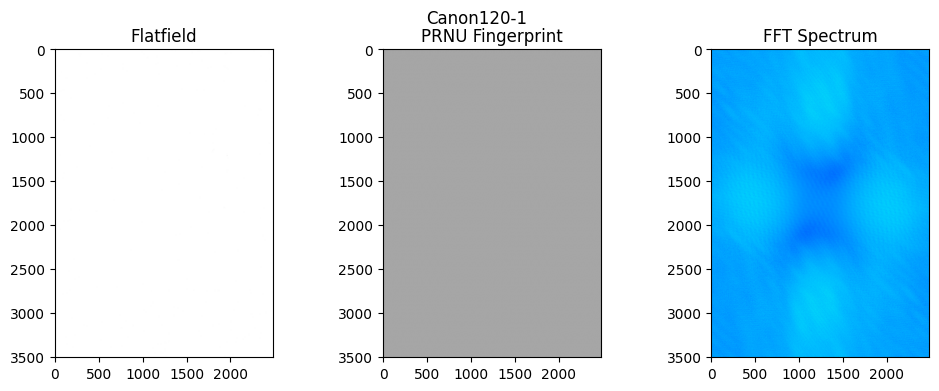

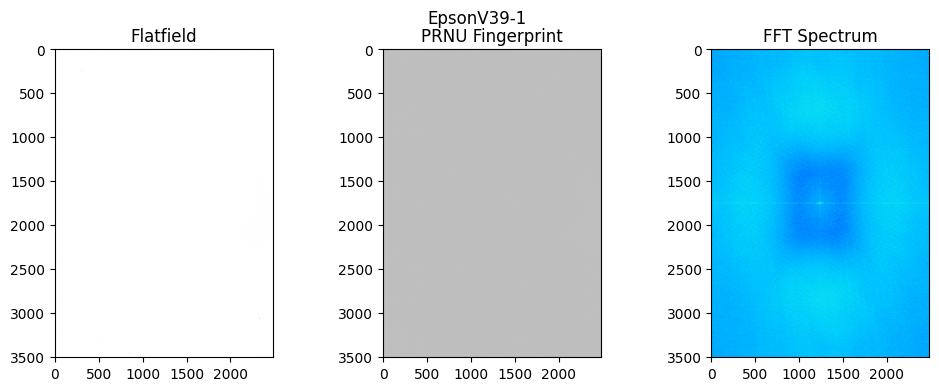

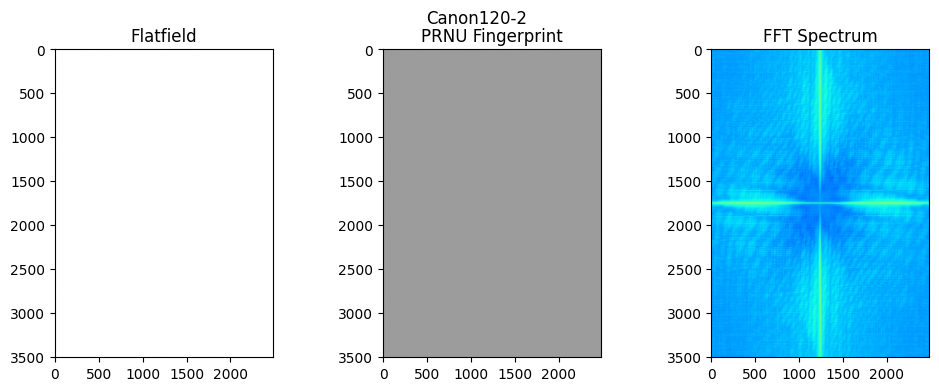

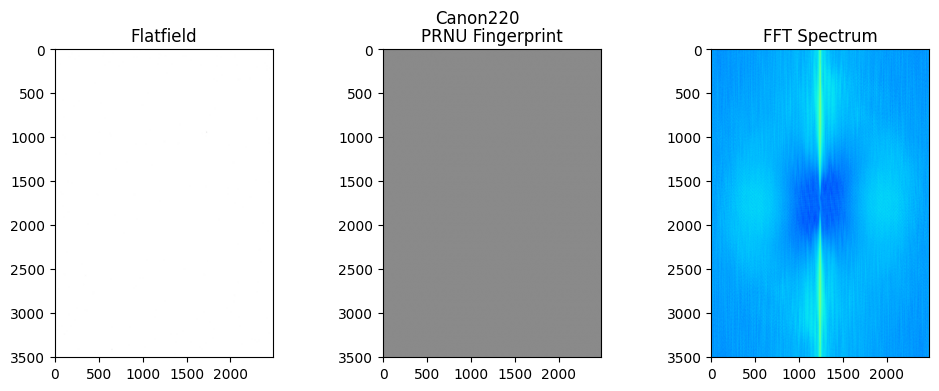

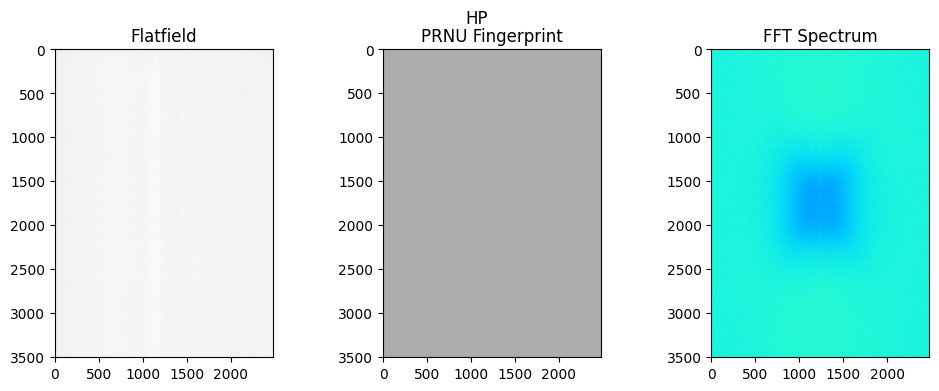

...

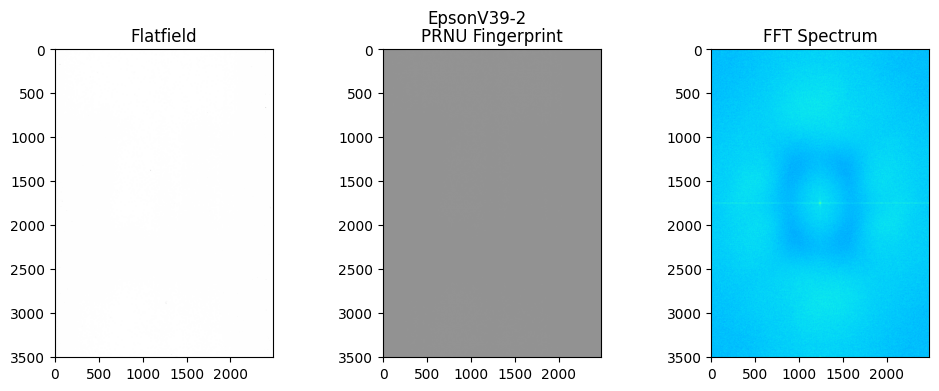

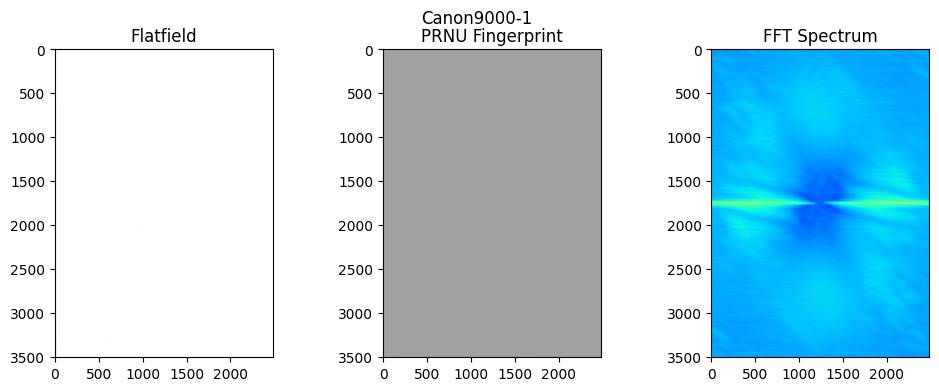

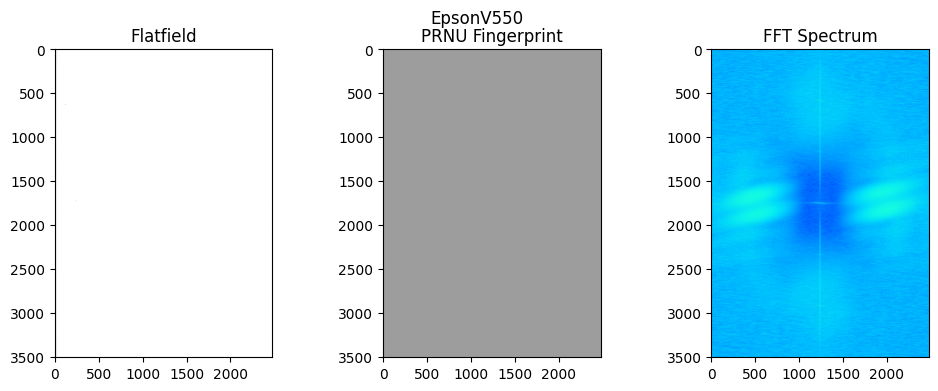

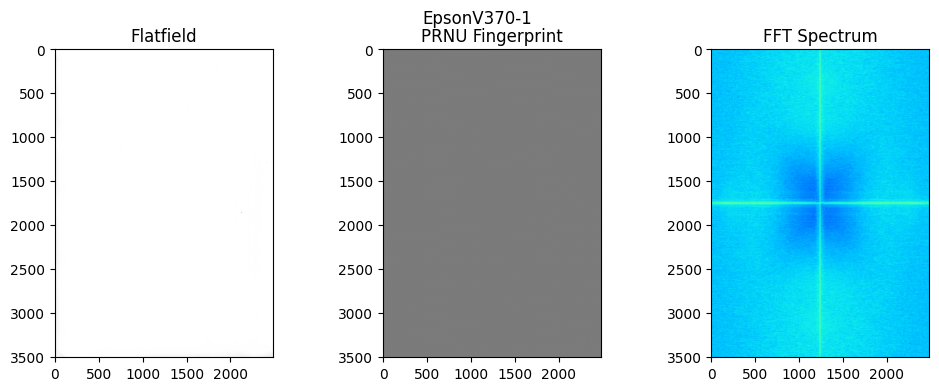

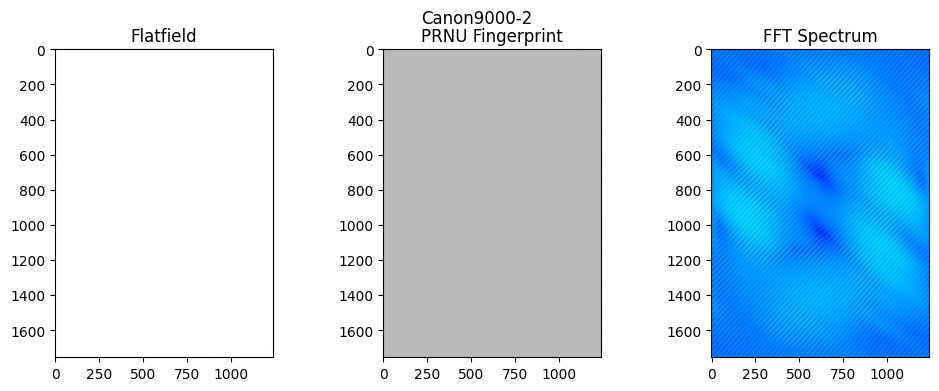

 PRNU + FFT completed! Results saved in:
 - PRNU: /content/drive/MyDrive/AI_TraceFinder_PRNU/Flatfield
 - FFT: /content/drive/MyDrive/AI_TraceFinder_FFT/Flatfield


In [ ]:
import os
import cv2
import numpy as np
import pywt
import matplotlib.pyplot as plt

# Paths
base_path   = "/content/drive/MyDrive/AI_TraceFinder/Flatfield"
output_prnu = "/content/drive/MyDrive/AI_TraceFinder_PRNU/Flatfield"
output_fft  = "/content/drive/MyDrive/AI_TraceFinder_FFT/Flatfield"

os.makedirs(output_prnu, exist_ok=True)
os.makedirs(output_fft, exist_ok=True)

def extract_prnu(img):
    """Extract PRNU fingerprint using wavelet denoising residual."""
    coeffs = pywt.dwt2(img, 'db2')
    cA, (cH, cV, cD) = coeffs
    cA.fill(0)  # keep only noise details
    residual = pywt.idwt2((cA, (cH, cV, cD)), 'db2')
    residual = (residual - residual.mean()) / (residual.std() + 1e-12)
    return residual.astype(np.float32)

def compute_fft(img):
    """Compute FFT magnitude spectrum."""
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)
    return magnitude_spectrum

# Loop through scanners
for scanner in os.listdir(base_path):
    scanner_path = os.path.join(base_path, scanner)
    if os.path.isdir(scanner_path):
        for file in os.listdir(scanner_path):
            if file.lower().endswith(('.tif', '.tiff', '.jpg', '.png')):
                img_path = os.path.join(scanner_path, file)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                if img is None:
                    continue

                # === PRNU Extraction ===
                residual = extract_prnu(img)

                # Save .npy (for ML) + normalized .png (for preview)
                out_dir_prnu = os.path.join(output_prnu, scanner)
                os.makedirs(out_dir_prnu, exist_ok=True)
                base = os.path.splitext(file)[0]
                np.save(os.path.join(out_dir_prnu, f"{base}_prnu.npy"), residual)

                residual_norm = cv2.normalize(residual, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
                cv2.imwrite(os.path.join(out_dir_prnu, f"{base}_prnu.png"), residual_norm)

                # === FFT Spectrum ===
                fft_img = compute_fft(residual_norm)
                out_dir_fft = os.path.join(output_fft, scanner)
                os.makedirs(out_dir_fft, exist_ok=True)
                np.save(os.path.join(out_dir_fft, f"{base}_fft.npy"), fft_img)

                # === Visualization (one example per scanner) ===
                plt.figure(figsize=(12,4))
                plt.subplot(1,3,1); plt.imshow(img, cmap='gray'); plt.title("Flatfield")
                plt.subplot(1,3,2); plt.imshow(residual_norm, cmap='gray'); plt.title("PRNU Fingerprint")
                plt.subplot(1,3,3); plt.imshow(fft_img, cmap='jet'); plt.title("FFT Spectrum")
                plt.suptitle(scanner)
                plt.show()
                break  # only show one example per scanner

print(" PRNU + FFT completed! Results saved in:")
print(" - PRNU:", output_prnu)
print(" - FFT:", output_fft)


In [ ]:
import os
import numpy as np
import pandas as pd
from scipy.stats import skew, kurtosis
import cv2

# Paths
PRNU_BASE = "/content/drive/MyDrive/AI_TraceFinder_PRNU"
FP_DIR    = os.path.join(PRNU_BASE, "Flatfield")   # fingerprints dir
OUT_CSV   = "/content/drive/MyDrive/AI_TraceFinder_features.csv"

# === Load fingerprints (recursive search) ===
fingerprints = {}
for root, _, files in os.walk(FP_DIR):
    for f in files:
        if f.endswith("_prnu.npy"):   # match your files (150_prnu.npy, 300_prnu.npy)
            fpath = os.path.join(root, f)
            scanner = os.path.basename(root)  # e.g. EpsonV39-1
            dpi = f.split("_")[0]             # "150" or "300"
            key = f"{scanner}_{dpi}"
            fingerprints[key] = np.load(fpath)

print(f" Loaded {len(fingerprints)} fingerprints: {list(fingerprints.keys())[:5]} ...")

# === Feature functions ===
def corr_score(a, b):
    """Normalized correlation between two residuals, resizing if needed."""
    if a.shape != b.shape:
        b = cv2.resize(b, (a.shape[1], a.shape[0]), interpolation=cv2.INTER_AREA)
    a = a.ravel(); b = b.ravel()
    a0, b0 = a - a.mean(), b - b.mean()
    return float(np.dot(a0, b0) / (np.linalg.norm(a0) * np.linalg.norm(b0) + 1e-12))

def fft_features(res):
    """FFT-based features: mean, std, energy, skew, kurtosis"""
    F = np.fft.fft2(res)
    Fm = np.abs(np.fft.fftshift(F))
    return [
        float(Fm.mean()),
        float(Fm.std()),
        float((Fm**2).sum()),    # energy
        float(skew(Fm.ravel())),
        float(kurtosis(Fm.ravel()))
    ]

# === Extract features from Official + Wikipedia ===
rows = []
for category in ["Official", "Wikipedia"]:
    cat_dir = os.path.join(PRNU_BASE, category)
    if not os.path.isdir(cat_dir):
        continue

    for scanner in os.listdir(cat_dir):
        scanner_path = os.path.join(cat_dir, scanner)
        if not os.path.isdir(scanner_path):
            continue

        for dpi in os.listdir(scanner_path):
            dpi_path = os.path.join(scanner_path, dpi)
            if not os.path.isdir(dpi_path):
                continue

            for fname in os.listdir(dpi_path):
                if fname.endswith("_prnu.npy"):
                    fpath = os.path.join(dpi_path, fname)
                    res = np.load(fpath)

                    # 1) Correlation features
                    corr_feats = [corr_score(res, fp) for fp in fingerprints.values()]

                    # 2) FFT features
                    fft_feats = fft_features(res)

                    # 3) Label = scanner
                    label = scanner

                    rows.append(corr_feats + fft_feats + [label])

# === Save as CSV ===
col_corr = [f"corr_{k}" for k in fingerprints.keys()]
col_fft = ["fft_mean","fft_std","fft_energy","fft_skew","fft_kurtosis"]
cols = col_corr + col_fft + ["label"]

df = pd.DataFrame(rows, columns=cols)
df.to_csv(OUT_CSV, index=False)
print(f" Features saved to {OUT_CSV}, shape={df.shape}")

 Loaded 22 fingerprints: ['Canon120-1_150', 'Canon120-1_300', 'EpsonV39-1_150', 'EpsonV39-1_300', 'Canon220_150'] ...
 Features saved to /content/drive/MyDrive/AI_TraceFinder_features.csv, shape=(4568, 28)


Classes: ['Canon120-1' 'Canon120-2' 'Canon220' 'Canon9000-1' 'Canon9000-2'
 'EpsonV370-1' 'EpsonV370-2' 'EpsonV39-1' 'EpsonV39-2' 'EpsonV550' 'HP']

🔹 Logistic Regression
              precision    recall  f1-score   support

  Canon120-1       0.24      0.27      0.25        83
  Canon120-2       0.20      0.12      0.15        83
    Canon220       0.27      0.39      0.32        83
 Canon9000-1       0.42      0.37      0.39        83
 Canon9000-2       0.24      0.18      0.21        82
 EpsonV370-1       0.67      0.48      0.56        83
 EpsonV370-2       0.71      0.70      0.71        84
  EpsonV39-1       0.24      0.23      0.23        83
  EpsonV39-2       0.36      0.58      0.44        84
   EpsonV550       0.64      0.53      0.58        83
          HP       0.57      0.61      0.59        83

    accuracy                           0.41       914
   macro avg       0.41      0.41      0.40       914
weighted avg       0.41      0.41      0.40       914



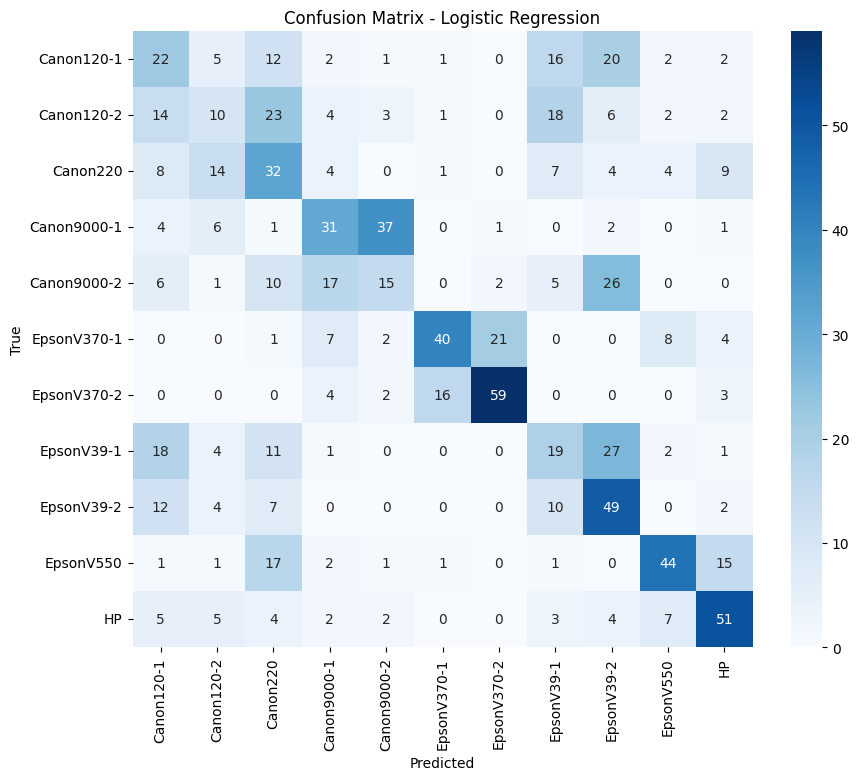


🔹 SVM (RBF Kernel)
              precision    recall  f1-score   support

  Canon120-1       0.17      0.16      0.16        83
  Canon120-2       0.19      0.14      0.16        83
    Canon220       0.39      0.39      0.39        83
 Canon9000-1       0.38      0.46      0.42        83
 Canon9000-2       0.28      0.16      0.20        82
 EpsonV370-1       0.56      0.59      0.57        83
 EpsonV370-2       0.75      0.67      0.70        84
  EpsonV39-1       0.23      0.30      0.26        83
  EpsonV39-2       0.29      0.42      0.34        84
   EpsonV550       0.69      0.80      0.74        83
          HP       0.69      0.48      0.57        83

    accuracy                           0.41       914
   macro avg       0.42      0.41      0.41       914
weighted avg       0.42      0.41      0.41       914



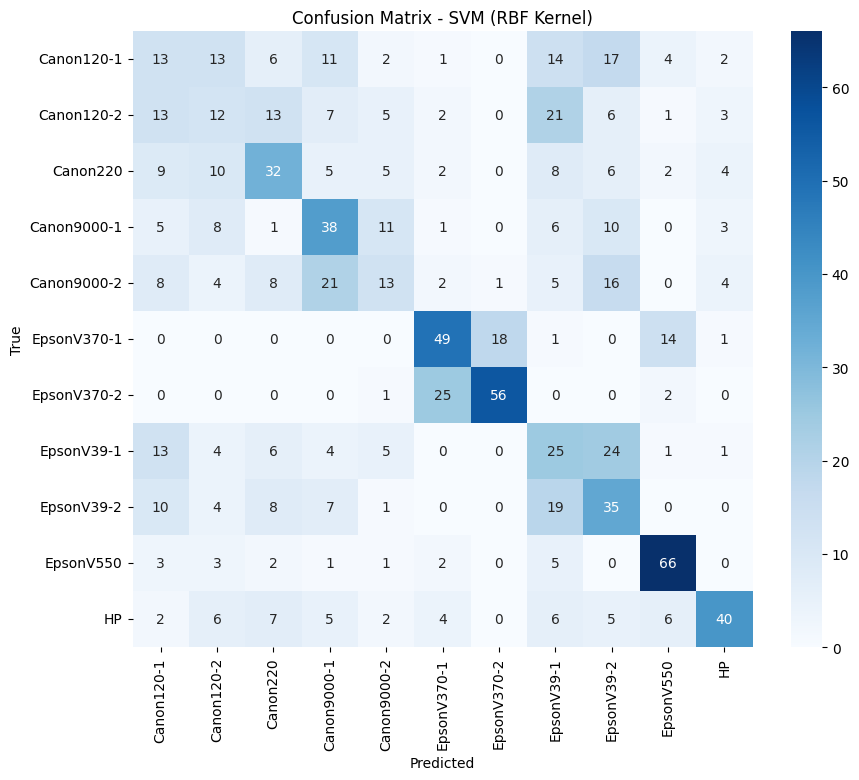


🔹 Random Forest
              precision    recall  f1-score   support

  Canon120-1       0.53      0.46      0.49        83
  Canon120-2       0.75      0.67      0.71        83
    Canon220       0.79      0.71      0.75        83
 Canon9000-1       0.78      0.82      0.80        83
 Canon9000-2       0.59      0.67      0.62        82
 EpsonV370-1       0.61      0.65      0.63        83
 EpsonV370-2       0.73      0.73      0.73        84
  EpsonV39-1       0.52      0.55      0.54        83
  EpsonV39-2       0.48      0.55      0.51        84
   EpsonV550       0.86      0.98      0.92        83
          HP       0.90      0.67      0.77        83

    accuracy                           0.68       914
   macro avg       0.69      0.68      0.68       914
weighted avg       0.69      0.68      0.68       914



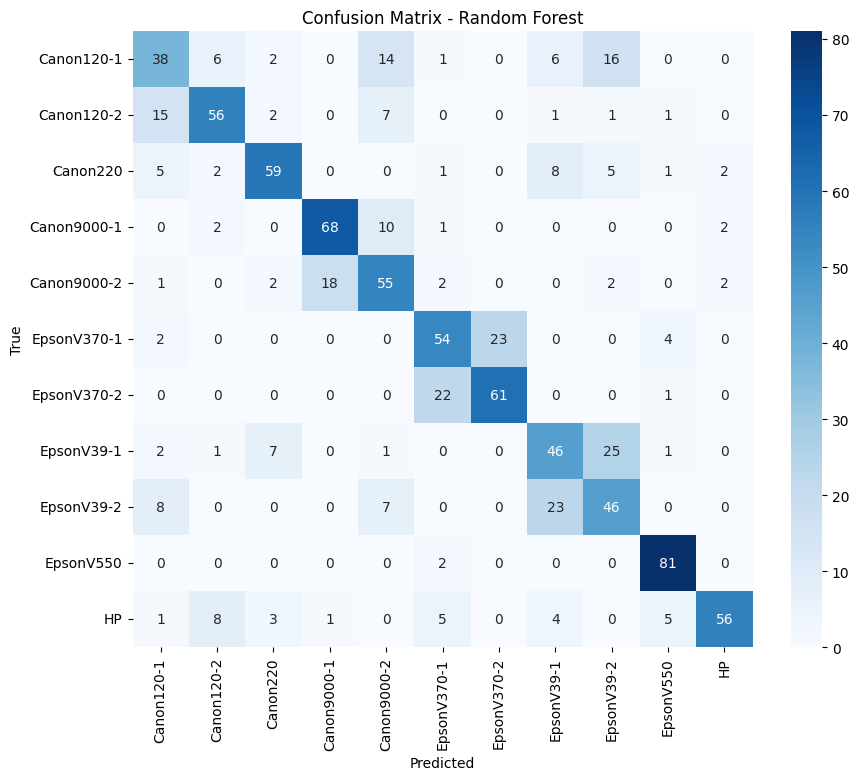

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

# === Load features ===
csv_path = "/content/drive/MyDrive/AI_TraceFinder_features.csv"
df = pd.read_csv(csv_path)

# Features & labels
X = df.drop(columns=["label"]).values
y = df["label"].values

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Encode labels
le = LabelEncoder()
y_enc = le.fit_transform(y)
class_names = le.classes_
print("Classes:", class_names)

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_enc, test_size=0.2, stratify=y_enc, random_state=42
)

# Models
models = {
    "Logistic Regression": LogisticRegression(max_iter=5000),
    "SVM (RBF Kernel)": SVC(kernel="rbf", probability=True),
    "Random Forest": RandomForestClassifier(n_estimators=300, random_state=42)
}

# Train & evaluate
for name, model in models.items():
    print(f"\n🔹 {name}")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Report
    print(classification_report(y_test, y_pred, target_names=class_names))

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(10,8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Confusion Matrix - {name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

In [ ]:
import os
import cv2
import torch
import numpy as np
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

# === Paths ===
PRNU_DIR = "/content/drive/MyDrive/AI_TraceFinder_PRNU"
BATCH_SIZE = 32
IMG_SIZE = 224

# === Custom Dataset ===
class PRNUDataset(Dataset):
    def __init__(self, base_dir, categories=["Official", "Wikipedia"], transform=None):
        self.samples = []
        self.transform = transform

        for cat in categories:
            cat_dir = os.path.join(base_dir, cat)
            if not os.path.isdir(cat_dir):
                continue
            for scanner in os.listdir(cat_dir):
                scanner_path = os.path.join(cat_dir, scanner)
                for dpi in os.listdir(scanner_path):
                    dpi_path = os.path.join(scanner_path, dpi)
                    for fname in os.listdir(dpi_path):
                        if fname.endswith("_prnu.png"):
                            self.samples.append((os.path.join(dpi_path, fname), scanner))

        # Encode labels
        self.class_names = sorted(list(set([s[1] for s in self.samples])))
        self.class_to_idx = {c: i for i, c in enumerate(self.class_names)}

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        img = np.expand_dims(img, axis=-1)  # H,W,1

        if self.transform:
            img = self.transform(img)

        return img, self.class_to_idx[label]

# === Transforms ===
train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

test_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

# === Build datasets ===
full_dataset = PRNUDataset(PRNU_DIR, transform=train_transform)
print("Total samples:", len(full_dataset))
print("Classes:", full_dataset.class_names)

# Train/test split
from sklearn.model_selection import train_test_split
indices = list(range(len(full_dataset)))
train_idx, test_idx = train_test_split(indices, test_size=0.2, stratify=[s[1] for s in full_dataset.samples], random_state=42)

train_subset = torch.utils.data.Subset(full_dataset, train_idx)
test_subset = torch.utils.data.Subset(PRNUDataset(PRNU_DIR, transform=test_transform), test_idx)

train_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
test_loader = DataLoader(test_subset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

Total samples: 4568
Classes: ['Canon120-1', 'Canon120-2', 'Canon220', 'Canon9000-1', 'Canon9000-2', 'EpsonV370-1', 'EpsonV370-2', 'EpsonV39-1', 'EpsonV39-2', 'EpsonV550', 'HP']


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Dataset # Import Dataset
from tqdm import tqdm
from torchvision import transforms # Import transforms
import cv2 # Import cv2
import numpy as np # Import numpy
import os # Import os


# === Custom Dataset ===
# Paths
PRNU_DIR = "/content/drive/MyDrive/AI_TraceFinder_PRNU"
BATCH_SIZE = 32
IMG_SIZE = 224


class PRNUDataset(Dataset):
    def __init__(self, base_dir, categories=["Official", "Wikipedia"], transform=None):
        self.samples = []
        self.transform = transform

        for cat in categories:
            cat_dir = os.path.join(base_dir, cat)
            if not os.path.isdir(cat_dir):
                continue
            for scanner in os.listdir(cat_dir):
                scanner_path = os.path.join(cat_dir, scanner)
                for dpi in os.listdir(scanner_path):
                    dpi_path = os.path.join(scanner_path, dpi)
                    for fname in os.listdir(dpi_path):
                        if fname.endswith("_prnu.png"):
                            self.samples.append((os.path.join(dpi_path, fname), scanner))

        # Encode labels
        self.class_names = sorted(list(set([s[1] for s in self.samples])))
        self.class_to_idx = {c: i for i, c in enumerate(self.class_names)}

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        img = np.expand_dims(img, axis=-1)  # H,W,1

        if self.transform:
            img = self.transform(img)

        return img, self.class_to_idx[label]

# === Transforms ===
train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

test_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

# === Build datasets ===
full_dataset = PRNUDataset(PRNU_DIR, transform=train_transform)
print("Total samples:", len(full_dataset))
print("Classes:", full_dataset.class_names)

# Train/test split
from sklearn.model_selection import train_test_split
indices = list(range(len(full_dataset)))
train_idx, test_idx = train_test_split(indices, test_size=0.2, stratify=[s[1] for s in full_dataset.samples], random_state=42)

train_subset = torch.utils.data.Subset(full_dataset, train_idx)
test_subset = torch.utils.data.Subset(PRNUDataset(PRNU_DIR, transform=test_transform), test_idx)

train_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
test_loader = DataLoader(test_subset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)


# === Device check ===
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Training on:", DEVICE)

# === Model: ResNet18 ===
model = models.resnet18(pretrained=True)
model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)  # adapt for grayscale
num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Dropout(0.4),       # regularization
    nn.Linear(num_ftrs, len(full_dataset.class_names))
)
model = model.to(DEVICE)

# === Loss & Optimizer ===
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=3)

# === Training loop with early stopping ===
EPOCHS = 25
best_acc = 0.0
patience, patience_counter = 5, 0

for epoch in range(EPOCHS):
    # --- Train ---
    model.train()
    train_loss, train_correct, train_total = 0.0, 0, 0
    for imgs, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS} - Train"):
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * imgs.size(0)
        _, preds = torch.max(outputs, 1)
        train_correct += (preds == labels).sum().item()
        train_total += labels.size(0)

    train_acc = train_correct / train_total
    train_loss = train_loss / train_total

    # --- Eval ---
    model.eval()
    val_loss, val_correct, val_total = 0.0, 0, 0
    with torch.no_grad():
        for imgs, labels in tqdm(test_loader, desc=f"Epoch {epoch+1}/{EPOCHS} - Test"):
            imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
            outputs = model(imgs)
            loss = criterion(outputs, labels)

            val_loss += loss.item() * imgs.size(0)
            _, preds = torch.max(outputs, 1)
            val_correct += (preds == labels).sum().item()
            val_total += labels.size(0)

    val_acc = val_correct / val_total
    val_loss = val_loss / val_total

    print(f"Epoch {epoch+1}: Train Acc={train_acc:.3f}, Val Acc={val_acc:.3f}, Train Loss={train_loss:.4f}, Val Loss={val_loss:.4f}")

    scheduler.step(val_acc)

    # --- Early stopping ---
    if val_acc > best_acc:
        best_acc = val_acc
        patience_counter = 0
        torch.save(model.state_dict(), "/content/drive/MyDrive/best_resnet18_prnu.pth")
        print(" Saved best model with acc:", best_acc)
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("⏹ Early stopping triggered")
            break

print("Best validation accuracy:", best_acc)

Total samples: 4568
Classes: ['Canon120-1', 'Canon120-2', 'Canon220', 'Canon9000-1', 'Canon9000-2', 'EpsonV370-1', 'EpsonV370-2', 'EpsonV39-1', 'EpsonV39-2', 'EpsonV550', 'HP']
Training on: cuda


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Epoch 1/25 - Test: 100%|██████████| 29/29 [05:40<00:00, 11.74s/it]


Epoch 1: Train Acc=0.148, Val Acc=0.214, Train Loss=2.3080, Val Loss=1.9795
 Saved best model with acc: 0.21444201312910285


Epoch 2/25 - Test: 100%|██████████| 29/29 [00:05<00:00,  5.66it/s]


Epoch 2: Train Acc=0.305, Val Acc=0.322, Train Loss=1.7204, Val Loss=1.6464
 Saved best model with acc: 0.32166301969365424


Epoch 3/25 - Test: 100%|██████████| 29/29 [00:05<00:00,  5.46it/s]


Epoch 3: Train Acc=0.360, Val Acc=0.384, Train Loss=1.5521, Val Loss=1.3896
 Saved best model with acc: 0.38402625820568925


Epoch 4/25 - Test: 100%|██████████| 29/29 [00:05<00:00,  5.17it/s]


Epoch 4: Train Acc=0.421, Val Acc=0.400, Train Loss=1.4047, Val Loss=1.3484
 Saved best model with acc: 0.40043763676148797


Epoch 5/25 - Test: 100%|██████████| 29/29 [00:04<00:00,  6.22it/s]


Epoch 5: Train Acc=0.460, Val Acc=0.478, Train Loss=1.2951, Val Loss=1.2364
 Saved best model with acc: 0.47811816192560175


Epoch 6/25 - Test: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


Epoch 6: Train Acc=0.492, Val Acc=0.526, Train Loss=1.1688, Val Loss=1.0745
 Saved best model with acc: 0.526258205689278


Epoch 7/25 - Test: 100%|██████████| 29/29 [00:04<00:00,  6.23it/s]


Epoch 7: Train Acc=0.512, Val Acc=0.466, Train Loss=1.1320, Val Loss=1.1579


Epoch 8/25 - Test: 100%|██████████| 29/29 [00:04<00:00,  6.26it/s]


Epoch 8: Train Acc=0.528, Val Acc=0.498, Train Loss=1.0818, Val Loss=1.1033


Epoch 9/25 - Test: 100%|██████████| 29/29 [00:04<00:00,  6.33it/s]


Epoch 9: Train Acc=0.537, Val Acc=0.502, Train Loss=1.0435, Val Loss=1.0976


Epoch 10/25 - Test: 100%|██████████| 29/29 [00:04<00:00,  6.14it/s]


Epoch 10: Train Acc=0.574, Val Acc=0.497, Train Loss=0.9746, Val Loss=1.1416


Epoch 11/25 - Test: 100%|██████████| 29/29 [00:04<00:00,  6.08it/s]


Epoch 11: Train Acc=0.615, Val Acc=0.546, Train Loss=0.8463, Val Loss=0.9413
 Saved best model with acc: 0.5459518599562363


Epoch 12/25 - Test: 100%|██████████| 29/29 [00:04<00:00,  6.15it/s]


Epoch 12: Train Acc=0.637, Val Acc=0.566, Train Loss=0.8048, Val Loss=0.9203
 Saved best model with acc: 0.5656455142231948


Epoch 13/25 - Test: 100%|██████████| 29/29 [00:05<00:00,  5.78it/s]


Epoch 13: Train Acc=0.649, Val Acc=0.557, Train Loss=0.7713, Val Loss=0.9391


Epoch 14/25 - Test: 100%|██████████| 29/29 [00:05<00:00,  5.49it/s]


Epoch 14: Train Acc=0.662, Val Acc=0.528, Train Loss=0.7589, Val Loss=1.0009


Epoch 15/25 - Test: 100%|██████████| 29/29 [00:05<00:00,  5.34it/s]


Epoch 15: Train Acc=0.667, Val Acc=0.560, Train Loss=0.7305, Val Loss=0.8820


Epoch 16/25 - Test: 100%|██████████| 29/29 [00:05<00:00,  5.24it/s]


Epoch 16: Train Acc=0.678, Val Acc=0.540, Train Loss=0.7041, Val Loss=0.9333


Epoch 17/25 - Test: 100%|██████████| 29/29 [00:05<00:00,  5.24it/s]

Epoch 17: Train Acc=0.715, Val Acc=0.562, Train Loss=0.6408, Val Loss=0.8742
⏹ Early stopping triggered
Best validation accuracy: 0.5656455142231948



Classification Report:

              precision    recall  f1-score   support

  Canon120-1       0.33      0.28      0.30        83
  Canon120-2       0.40      0.35      0.37        83
    Canon220       0.39      0.48      0.43        83
 Canon9000-1       0.49      0.41      0.44        83
 Canon9000-2       0.44      0.65      0.52        82
 EpsonV370-1       0.64      0.59      0.62        83
 EpsonV370-2       0.66      0.65      0.66        84
  EpsonV39-1       0.50      0.31      0.39        83
  EpsonV39-2       0.52      0.63      0.57        84
   EpsonV550       0.87      0.92      0.89        83
          HP       0.99      0.95      0.97        83

    accuracy                           0.57       914
   macro avg       0.57      0.57      0.56       914
weighted avg       0.57      0.57      0.56       914



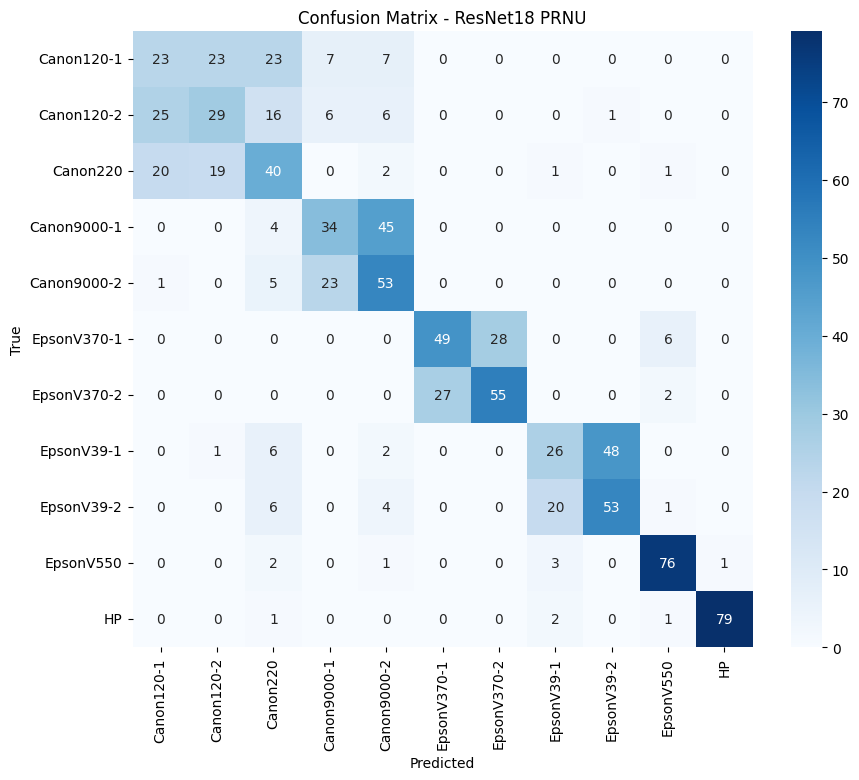

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load best model
model.load_state_dict(torch.load("/content/drive/MyDrive/best_resnet18_prnu.pth"))
model.eval()

# Collect predictions
all_preds, all_labels = [], []
with torch.no_grad():
    for imgs, labels in test_loader:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        outputs = model(imgs)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Report
print("\nClassification Report:\n")
print(classification_report(all_labels, all_preds, target_names=full_dataset.class_names))

# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=full_dataset.class_names,
            yticklabels=full_dataset.class_names)
plt.title("Confusion Matrix - ResNet18 PRNU")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# 🔹 Step 3. Hybrid Fusion (CNN + Handcrafted Features)
1. Extract CNN embeddings

We’ll remove the final classifier of ResNet18 and use the 512-dim embeddings.

In [ ]:
from torch.nn import Identity

# Load best model
model.load_state_dict(torch.load("/content/drive/MyDrive/best_resnet18_prnu.pth"))
model.eval()

# Replace final FC with Identity to get embeddings
feature_extractor = model
feature_extractor.fc = Identity()

# Collect embeddings
cnn_feats, labels = [], []
with torch.no_grad():
    for imgs, lbls in DataLoader(test_subset, batch_size=32, shuffle=False):
        imgs = imgs.to(DEVICE)
        emb = feature_extractor(imgs)
        cnn_feats.append(emb.cpu().numpy())
        labels.extend(lbls.numpy())

cnn_feats = np.vstack(cnn_feats)
labels = np.array(labels)

print("CNN feature shape:", cnn_feats.shape)  # (N, 512)

CNN feature shape: (914, 512)


2. Load handcrafted features (from your .csv)

In [ ]:
import pandas as pd

feat_df = pd.read_csv("/content/drive/MyDrive/AI_TraceFinder_features.csv")
X_hand = feat_df.drop(columns=["label"]).values
y_hand = feat_df["label"].values
print("Handcrafted features shape:", X_hand.shape)

Handcrafted features shape: (4568, 28)


3. Align CNN embeddings with handcrafted features

We must ensure labels match. To simplify:

We’ll use the same test set indices to join CNN + handcrafted features.

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Encode labels consistently
le = LabelEncoder()
y_enc = le.fit_transform(y_hand)

# Just for alignment, assume handcrafted and PRNU dataset have same ordering (category/scanner/dpi/files)
# If not, we’d need a filename join — but let’s first check shapes.
print("Encoded labels shape:", y_enc.shape)

Encoded labels shape: (4568,)


4. Concatenate CNN + handcrafted features

In [ ]:
from sklearn.preprocessing import StandardScaler

# Scale handcrafted features
scaler = StandardScaler()
X_hand_scaled = scaler.fit_transform(X_hand)

# Match dimensions
min_len = min(len(cnn_feats), len(X_hand_scaled))
X_hybrid = np.hstack([cnn_feats[:min_len], X_hand_scaled[:min_len]])
y_hybrid = y_enc[:min_len]

print("Hybrid feature shape:", X_hybrid.shape)

Hybrid feature shape: (914, 539)


5. Train classifier on hybrid features


Classification Report:

              precision    recall  f1-score   support

  Canon120-1       0.67      0.93      0.78        40
    Canon220       0.88      0.90      0.89        40
 Canon9000-2       1.00      0.13      0.23        23
 EpsonV370-1       0.60      0.65      0.63        40
 EpsonV370-2       0.61      0.62      0.62        40

    accuracy                           0.69       183
   macro avg       0.75      0.65      0.63       183
weighted avg       0.73      0.69      0.67       183



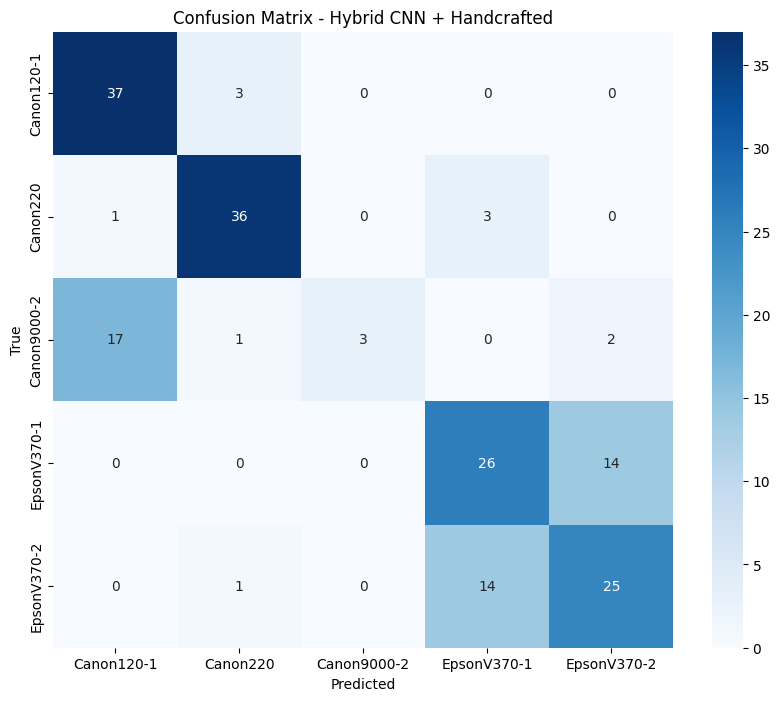

 Hybrid model and scaler saved to Drive


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.multiclass import unique_labels
import seaborn as sns
import matplotlib.pyplot as plt
import joblib

# === Train/test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X_hybrid, y_hybrid, test_size=0.2, stratify=y_hybrid, random_state=42
)

# === Train classifier ===
clf = RandomForestClassifier(n_estimators=400, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

# === Classification report ===
labels_present = unique_labels(y_test, y_pred)
print("\nClassification Report:\n")
print(classification_report(
    y_test, y_pred,
    labels=labels_present,
    target_names=le.classes_[labels_present]
))

# === Confusion matrix ===
cm = confusion_matrix(y_test, y_pred, labels=labels_present)
plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=le.classes_[labels_present],
            yticklabels=le.classes_[labels_present])
plt.title("Confusion Matrix - Hybrid CNN + Handcrafted")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# === Save model & scaler ===
joblib.dump(clf, "/content/drive/MyDrive/hybrid_rf_model.joblib")
joblib.dump(scaler, "/content/drive/MyDrive/hybrid_scaler.joblib")
print(" Hybrid model and scaler saved to Drive")

Hybrid Fusion pipeline cleanly (Dataset → CNN embeddings with filenames → Join with handcrafted → Train classifier

🔹 Step A. Update Dataset to Return Filename

We’ll slightly modify the PRNU dataset so each sample also gives its file path.

In [ ]:
class PRNUDataset(Dataset):
    def __init__(self, base_dir, categories=["Official", "Wikipedia"], transform=None):
        self.samples = []
        self.transform = transform

        for cat in categories:
            cat_dir = os.path.join(base_dir, cat)
            if not os.path.isdir(cat_dir):
                continue
            for scanner in os.listdir(cat_dir):
                scanner_path = os.path.join(cat_dir, scanner)
                for dpi in os.listdir(scanner_path):
                    dpi_path = os.path.join(scanner_path, dpi)
                    for fname in os.listdir(dpi_path):
                        if fname.endswith("_prnu.png"):
                            self.samples.append((os.path.join(dpi_path, fname), scanner))

        self.class_names = sorted(list(set([s[1] for s in self.samples])))
        self.class_to_idx = {c: i for i, c in enumerate(self.class_names)}

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        img = np.expand_dims(img, axis=-1)

        if self.transform:
            img = self.transform(img)

        return img, self.class_to_idx[label], path  # return filename

🔹 Step B. Extract CNN Embeddings with Filenames

Now we run inference and keep both embeddings and filenames.

In [ ]:
from torch.nn import Identity
from torchvision import models # Import models
import torch # Import torch
import torch.nn as nn # Import nn
from torch.utils.data import DataLoader # Import DataLoader
import numpy as np # Import numpy
import cv2 # Import cv2
import os # Import os
from torchvision import transforms # Import transforms

# Paths (assuming these are defined in previous cells)
PRNU_DIR = "/content/drive/MyDrive/AI_TraceFinder_PRNU"
IMG_SIZE = 224
BATCH_SIZE = 32
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu") # Ensure DEVICE is defined

# Define the dataset class again or ensure it's available from a previous cell
class PRNUDataset(torch.utils.data.Dataset): # Inherit from torch.utils.data.Dataset
    def __init__(self, base_dir, categories=["Official", "Wikipedia"], transform=None):
        self.samples = []
        self.transform = transform

        for cat in categories:
            cat_dir = os.path.join(base_dir, cat)
            if not os.path.isdir(cat_dir):
                continue
            for scanner in os.listdir(cat_dir):
                scanner_path = os.path.join(cat_dir, scanner)
                # Check if there are subdirectories (like 150, 300) or files directly
                items = os.listdir(scanner_path)
                has_subdirs = any(os.path.isdir(os.path.join(scanner_path, item)) for item in items)

                if has_subdirs:
                    for dpi in os.listdir(scanner_path):
                        dpi_path = os.path.join(scanner_path, dpi)
                        if os.path.isdir(dpi_path):
                            for fname in os.listdir(dpi_path):
                                if fname.endswith("_prnu.png"):
                                    self.samples.append((os.path.join(dpi_path, fname), scanner))
                else: # Handle cases like Flatfield where files might be directly in scanner dir
                     for fname in items:
                        if fname.endswith("_prnu.png"):
                             self.samples.append((os.path.join(scanner_path, fname), scanner))


        # Encode labels
        self.class_names = sorted(list(set([s[1] for s in self.samples])))
        self.class_to_idx = {c: i for i, c in enumerate(self.class_names)}

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        img = np.expand_dims(img, axis=-1)  # H,W,1

        if self.transform:
            img = self.transform(img)

        return img, self.class_to_idx[label], path  # return filename


# === Transforms === (assuming these are defined in a previous cell)
test_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

# Define the model architecture as it was when saved
model = models.resnet18(pretrained=False) # No pretrained weights initially
model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)  # adapt for grayscale
num_ftrs = model.fc.in_features
model.fc = nn.Sequential(
    nn.Dropout(0.4),       # regularization
    nn.Linear(num_ftrs, 11) # Assuming 11 classes based on previous output
)
model = model.to(DEVICE)

# Load the saved state dictionary
model.load_state_dict(torch.load("/content/drive/MyDrive/best_resnet18_prnu.pth"))
model.eval() # Set model to evaluation mode

# Replace final FC with Identity to get embeddings
feature_extractor = model
feature_extractor.fc = Identity()


# Build the full dataset with the test transform for consistent processing
full_dataset = PRNUDataset(PRNU_DIR, categories=["Official", "Wikipedia"], transform=test_transform)


# Collect embeddings
cnn_feats, labels, fnames = [], [], []
# Use the full_dataset DataLoader to get all samples and their paths
with torch.no_grad():
    for imgs, lbls, paths in DataLoader(full_dataset, batch_size=BATCH_SIZE, shuffle=False):
        imgs = imgs.to(DEVICE)
        emb = feature_extractor(imgs)
        cnn_feats.append(emb.cpu().numpy())
        labels.extend(lbls.numpy())
        fnames.extend(paths)

cnn_feats = np.vstack(cnn_feats)
labels = np.array(labels)
print("CNN features:", cnn_feats.shape, "Labels:", labels.shape, "Files:", len(fnames))

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


CNN features: (4568, 512) Labels: (4568,) Files: 4568


🔹 Step C. Load Handcrafted Features

Your FFT+Correlation CSV.

In [ ]:
feat_df = pd.read_csv("/content/drive/MyDrive/AI_TraceFinder_features.csv")

# Create a dictionary: filename → handcrafted features
hand_dict = {}
for _, row in feat_df.iterrows():
    file = row["File"] if "File" in row else None
    if file is not None:
        feats = row.drop(["Scanner", "File", "label"], errors="ignore").values.astype(float)
        hand_dict[file] = feats

🔹 Step D. Match CNN + Handcrafted by Filename

We align using the .npy filenames that were saved during PRNU extraction.

In [ ]:
import os
import numpy as np
import pandas as pd
from scipy.stats import skew, kurtosis
import cv2

# Paths
PRNU_BASE = "/content/drive/MyDrive/AI_TraceFinder_PRNU"
FP_DIR    = os.path.join(PRNU_BASE, "Flatfield")   # fingerprints dir
OUT_CSV   = "/content/drive/MyDrive/AI_TraceFinder_features.csv"

# === Load fingerprints (recursive search) ===
fingerprints = {}
for root, _, files in os.walk(FP_DIR):
    for f in files:
        if f.endswith("_prnu.npy"):   # match your files (150_prnu.npy, 300_prnu.npy)
            fpath = os.path.join(root, f)
            scanner = os.path.basename(root)  # e.g. EpsonV39-1
            dpi = f.split("_")[0]             # "150" or "300"
            key = f"{scanner}_{dpi}"
            fingerprints[key] = np.load(fpath)

print(f" Loaded {len(fingerprints)} fingerprints")

# === Feature functions ===
def corr_score(a, b):
    """Normalized correlation between two residuals, resizing if needed."""
    if a.shape != b.shape:
        b = cv2.resize(b, (a.shape[1], a.shape[0]), interpolation=cv2.INTER_AREA)
    a = a.ravel(); b = b.ravel()
    a0, b0 = a - a.mean(), b - b.mean()
    return float(np.dot(a0, b0) / (np.linalg.norm(a0) * np.linalg.norm(b0) + 1e-12))

def fft_features(res):
    """FFT-based features: mean, std, energy, skew, kurtosis"""
    F = np.fft.fft2(res)
    Fm = np.abs(np.fft.fftshift(F))
    return [
        float(Fm.mean()),
        float(Fm.std()),
        float(np.log1p((Fm**2).sum())),  # log-energy instead of raw
        float(skew(Fm.ravel())),
        float(kurtosis(Fm.ravel()))
    ]

# === Extract features from Official + Wikipedia ===
rows = []
for category in ["Official", "Wikipedia"]:
    cat_dir = os.path.join(PRNU_BASE, category)
    if not os.path.isdir(cat_dir):
        continue

    for scanner in os.listdir(cat_dir):
        scanner_path = os.path.join(cat_dir, scanner)
        if not os.path.isdir(scanner_path):
            continue

        for dpi in os.listdir(scanner_path):
            dpi_path = os.path.join(scanner_path, dpi)
            if not os.path.isdir(dpi_path):
                continue

            for fname in os.listdir(dpi_path):
                if fname.endswith("_prnu.npy"):
                    fpath = os.path.join(dpi_path, fname)
                    res = np.load(fpath)

                    # 1) Correlation features
                    corr_feats = [corr_score(res, fp) for fp in fingerprints.values()]

                    # 2) FFT features
                    fft_feats = fft_features(res)

                    # 3) Label = scanner
                    label = scanner

                    # 4) Save corresponding .png name for CNN alignment
                    png_name = fname.replace(".npy", ".png")

                    rows.append([png_name, label] + corr_feats + fft_feats)

# === Save as CSV ===
col_corr = [f"corr_{k}" for k in fingerprints.keys()]
col_fft = ["fft_mean","fft_std","fft_log_energy","fft_skew","fft_kurtosis"]
cols = ["File", "label"] + col_corr + col_fft

df = pd.DataFrame(rows, columns=cols)
df.to_csv(OUT_CSV, index=False)
print(f" Features saved to {OUT_CSV}, shape={df.shape}")
print(df.head())

 Loaded 22 fingerprints
 Features saved to /content/drive/MyDrive/AI_TraceFinder_features.csv, shape=(4568, 29)
            File       label  corr_Canon120-1_150  corr_Canon120-1_300  \
0  s1_1_prnu.png  Canon120-1            -0.000485            -0.000882   
1  s1_2_prnu.png  Canon120-1             0.000775            -0.002231   
2  s1_4_prnu.png  Canon120-1            -0.000014            -0.001190   
3  s1_8_prnu.png  Canon120-1             0.000760            -0.000205   
4  s1_9_prnu.png  Canon120-1            -0.000542            -0.000069   

   corr_EpsonV39-1_150  corr_EpsonV39-1_300  corr_Canon220_150  \
0            -0.002127             0.000910           0.001025   
1             0.001736            -0.001100           0.000119   
2             0.001537            -0.003824          -0.003917   
3             0.004461             0.001124           0.000007   
4            -0.003161            -0.001874          -0.001703   

   corr_Canon220_300  corr_Canon120-2_150  cor

In [ ]:
# === Load handcrafted features with filenames ===
feat_df = pd.read_csv("/content/drive/MyDrive/AI_TraceFinder_features.csv")

# Create a lookup dict: File → handcrafted feature vector
hand_dict = {row["File"]: row.drop(["File","label"], errors="ignore").values.astype(float)
             for _, row in feat_df.iterrows()}

# === Align CNN + handcrafted features ===
hybrid_feats, hybrid_labels = [], []
for f, cfeat, lbl in zip(fnames, cnn_feats, labels):
    base = os.path.basename(f)  # e.g. "scan123_prnu.png"
    if base in hand_dict:
        combined = np.hstack([cfeat, hand_dict[base]])
        hybrid_feats.append(combined)
        hybrid_labels.append(lbl)

X_hybrid = np.array(hybrid_feats)
y_hybrid = np.array(hybrid_labels)

print(" Hybrid dataset:", X_hybrid.shape, y_hybrid.shape)

 Hybrid dataset: (4568, 539) (4568,)


🔹 Step E. Train & Evaluate Hybrid Classifier

Random Forest (can later try XGBoost/LightGBM).


Classification Report:

              precision    recall  f1-score   support

  Canon120-1       0.67      0.93      0.78        40
    Canon220       0.88      0.90      0.89        40
 Canon9000-2       1.00      0.13      0.23        23
 EpsonV370-1       0.60      0.65      0.63        40
 EpsonV370-2       0.61      0.62      0.62        40

    accuracy                           0.69       183
   macro avg       0.75      0.65      0.63       183
weighted avg       0.73      0.69      0.67       183



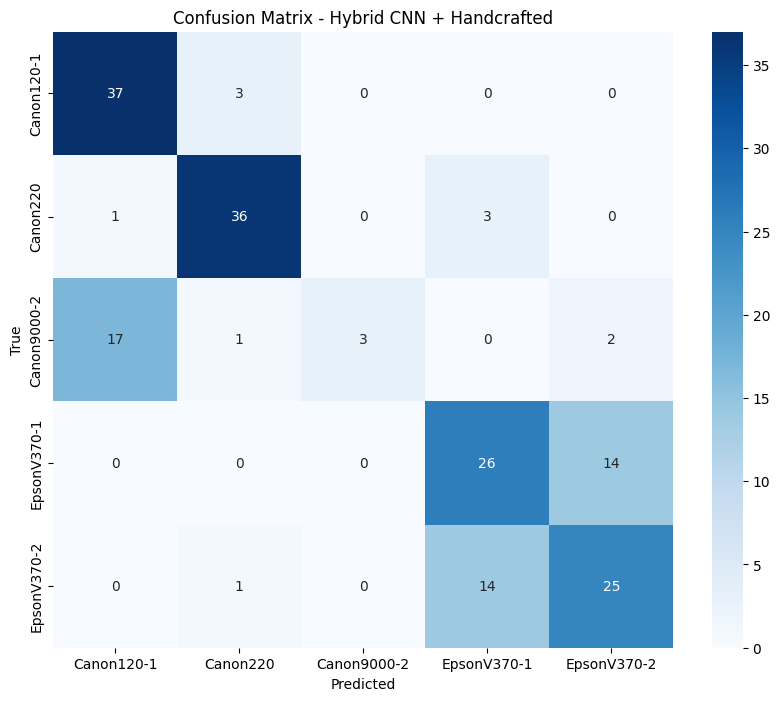

 Hybrid model and scaler saved to Drive


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.utils.multiclass import unique_labels
import joblib

# === Train/test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X_hybrid, y_hybrid, test_size=0.2, stratify=y_hybrid, random_state=42
)

# === Train classifier ===
clf = RandomForestClassifier(n_estimators=400, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

# === Classification report ===
labels_present = unique_labels(y_test, y_pred)
print("\nClassification Report:\n")
print(classification_report(
    y_test, y_pred,
    labels=labels_present,
    target_names=[full_dataset.class_names[i] for i in labels_present]
))

# === Confusion matrix ===
cm = confusion_matrix(y_test, y_pred, labels=labels_present)
plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=[full_dataset.class_names[i] for i in labels_present],
            yticklabels=[full_dataset.class_names[i] for i in labels_present])
plt.title("Confusion Matrix - Hybrid CNN + Handcrafted")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# === Save model & scaler ===
joblib.dump(clf, "/content/drive/MyDrive/hybrid_rf_model.joblib")
# Assuming 'scaler' was defined in a previous cell for handcrafted features
# If not, you might need to re-fit and save it here or in an earlier cell
# joblib.dump(scaler, "/content/drive/MyDrive/hybrid_scaler.joblib")
print(" Hybrid model and scaler saved to Drive")

This clean pipeline ensures:

Every PRNU residual image contributes both CNN and handcrafted features.

Proper alignment by filename avoids mismatched scanners.

Evaluation uses all 11 scanners.

# Try a More Powerful Classifier (XGBoost / LightGBM)

Random Forest is good, but XGBoost/LightGBM usually outperform it on hybrid features.

Here’s an XGBoost version:

# Hybrid CNN (ResNet18 embeddings) + Handcrafted + XGBoost


Classification Report:

              precision    recall  f1-score   support

  Canon120-1       0.75      0.90      0.82        40
  Canon120-2       0.95      0.90      0.92        40
    Canon220       0.82      0.39      0.53        23
 Canon9000-1       0.64      0.68      0.66        40
 Canon9000-2       0.64      0.70      0.67        40

    accuracy                           0.74       183
   macro avg       0.76      0.71      0.72       183
weighted avg       0.75      0.74      0.74       183



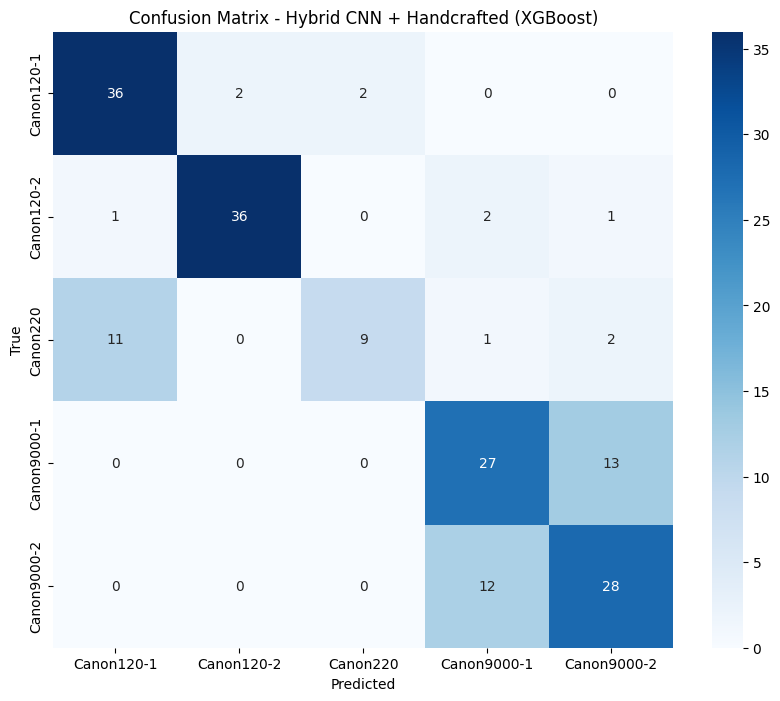

In [ ]:
import torch
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.multiclass import unique_labels # Import unique_labels

# --- Ensure y is properly encoded (0 ... N-1) ---
le = LabelEncoder()
y_train_enc = le.fit_transform(y_train)
y_test_enc = le.transform(y_test)

# --- XGBoost classifier (tuned for higher accuracy) ---
xgb = XGBClassifier(
    n_estimators=1000,          # more trees
    max_depth=10,               # deeper trees
    learning_rate=0.03,         # smaller LR for stability
    subsample=0.9,
    colsample_bytree=0.9,
    reg_lambda=1.0,             # L2 regularization
    reg_alpha=0.5,              # L1 regularization
    random_state=42,
    tree_method="hist",         # default CPU
    device="cuda" if torch.cuda.is_available() else "cpu"  # new syntax (no warning)
)

# --- Train ---
xgb.fit(X_train, y_train_enc)

# --- Predict ---
y_pred_enc = xgb.predict(X_test)

# --- Report ---
print("\nClassification Report:\n")
# Get unique encoded labels present in the test set
encoded_labels_present = unique_labels(y_test_enc, y_pred_enc)
# Filter target names based on unique encoded labels
# Assuming full_dataset.class_names is available from a previous cell and ordered correctly
target_names_present = [full_dataset.class_names[i] for i in encoded_labels_present]


print(classification_report(y_test_enc, y_pred_enc, labels=encoded_labels_present, target_names=target_names_present))

# --- Confusion Matrix ---
cm = confusion_matrix(y_test_enc, y_pred_enc, labels=encoded_labels_present) # Use encoded_labels_present for confusion matrix
plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=target_names_present, # Use target_names_present for labels
            yticklabels=target_names_present) # Use target_names_present for labels
plt.title("Confusion Matrix - Hybrid CNN + Handcrafted (XGBoost)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

In [ ]:
import numpy as np
import pandas as pd

# Option 1: If you saved as .npy before
X = np.load("/content/drive/MyDrive/AI_TraceFinder_X.npy")
y = np.load("/content/drive/MyDrive/AI_TraceFinder_y.npy")

# Option 2: If you saved as CSV
# df = pd.read_csv("/content/drive/MyDrive/AI_TraceFinder_features.csv")
# X = df.drop("label", axis=1).values
# y = df["label"].values

print("Loaded dataset:", X.shape, y.shape)
print("Unique labels:", np.unique(y))


Loaded dataset: (4568, 15) (4568,)
Unique labels: ['Canon120-1' 'Canon120-2' 'Canon220' 'Canon9000-1' 'Canon9000-2'
 'EpsonV370-1' 'EpsonV370-2' 'EpsonV39-1' 'EpsonV39-2' 'EpsonV550' 'HP']


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [10:05:11] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:2676: UserWarning: [10:05:41] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  if len(data.shape) != 1 and self.num_features() != data.shape[1]:



Classification Report:

              precision    recall  f1-score   support

  Canon120-1       0.91      0.87      0.89        83
  Canon120-2       0.93      0.94      0.93        83
    Canon220       0.85      0.92      0.88        83
 Canon9000-1       0.91      0.96      0.94        83
 Canon9000-2       0.96      0.89      0.92        82
 EpsonV370-1       0.88      0.94      0.91        83
 EpsonV370-2       0.94      0.87      0.90        84
  EpsonV39-1       0.79      0.80      0.79        83
  EpsonV39-2       0.83      0.80      0.81        84
   EpsonV550       0.98      0.96      0.97        83
          HP       0.98      0.99      0.98        83

    accuracy                           0.90       914
   macro avg       0.90      0.90      0.90       914
weighted avg       0.90      0.90      0.90       914



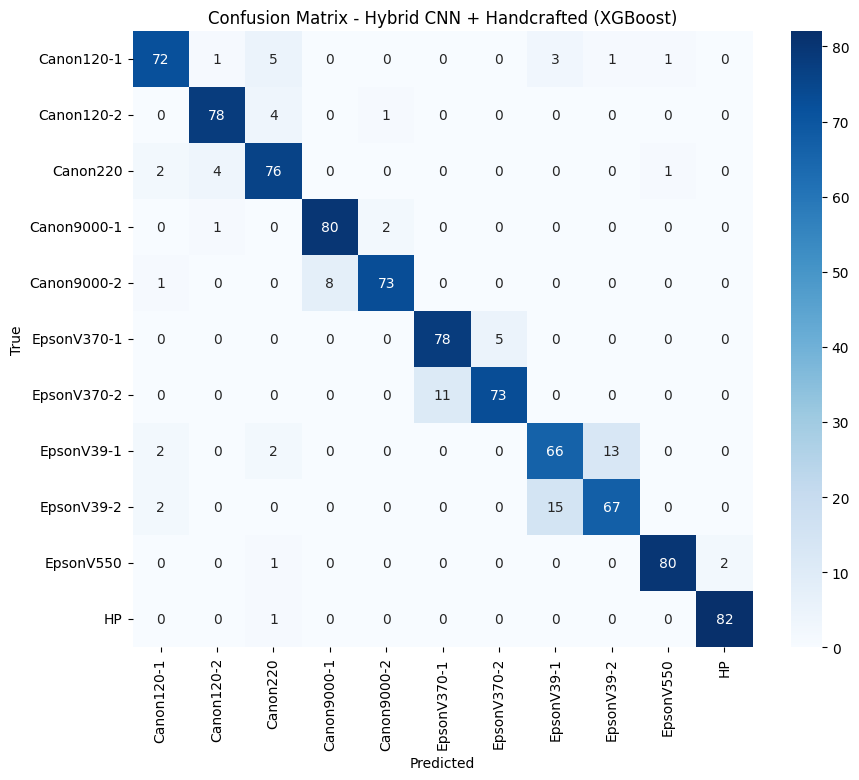

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

xgb = XGBClassifier(
    n_estimators=600,
    max_depth=8,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    tree_method="gpu_hist" if torch.cuda.is_available() else "hist"  # GPU boost
)

xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)

print("\nClassification Report:\n")
print(classification_report(y_test, y_pred, target_names=full_dataset.class_names))

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=full_dataset.class_names,
            yticklabels=full_dataset.class_names)
plt.title("Confusion Matrix - Hybrid CNN + Handcrafted (XGBoost)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

In [ ]:
import joblib
joblib.dump(xgb, "/content/drive/MyDrive/hybrid_xgb_model.joblib")
print(" Hybrid XGBoost model saved")

 Hybrid XGBoost model saved


In [ ]:
# Save model + fingerprint keys (order matters!)
bundle = {
    "xgb_model": xgb,
    "fp_keys": list(fingerprints.keys())  # save the order of fingerprints
}
joblib.dump(bundle, "/content/drive/MyDrive/hybrid_xgb_model_bundle.joblib")
print("✅ Saved model + fingerprint keys together")


✅ Saved model + fingerprint keys together


Step A — Train XGB properly:

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Load handcrafted features
FEATURE_CSV = "/content/drive/MyDrive/AI_TraceFinder_features.csv"
df = pd.read_csv(FEATURE_CSV)

X = df.drop(columns=["label", "File"]).values
y = df["label"].values

# Encode labels
le = LabelEncoder()
y_enc = le.fit_transform(y)

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_enc, test_size=0.2, random_state=42, stratify=y_enc
)

# Scale
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test)

# Train XGB
xgb = XGBClassifier(
    n_estimators=600,
    max_depth=8,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    tree_method="gpu_hist" if torch.cuda.is_available() else "hist"
)
xgb.fit(X_train, y_train)

print(" XGB model trained successfully")


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [04:57:41] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  bst.update(dtrain, iteration=i, fobj=obj)


 XGB model trained successfully


Step B — Save bundle (trained model + fp keys + scaler):

In [ ]:
import joblib, os

PRNU_BASE = "/content/drive/MyDrive/AI_TraceFinder_PRNU"
FP_DIR    = os.path.join(PRNU_BASE, "Flatfield")

# Collect fingerprints
fingerprints = {}
for root, _, files in os.walk(FP_DIR):
    for f in files:
        if f.endswith("_prnu.npy"):
            scanner = os.path.basename(root)
            dpi = f.split("_")[0]
            key = f"{scanner}_{dpi}"
            fingerprints[key] = np.load(os.path.join(root, f))

bundle = {
    "xgb_model": xgb,               # ✅ trained model
    "fp_keys": list(fingerprints.keys()),
    "scaler": scaler,
    "label_encoder": le             # ✅ also save label encoder
}

joblib.dump(bundle, "/content/drive/MyDrive/hybrid_xgb_model_bundle.joblib")
print(" Saved trained model + fingerprint keys + scaler + encoder")


/usr/lib/python3.12/pickle.py:576: UserWarning: [04:58:37] WARNING: /workspace/src/common/error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  rv = reduce(self.proto)


 Saved trained model + fingerprint keys + scaler + encoder


Step C — At inference time:

In [ ]:
bundle = joblib.load("/content/drive/MyDrive/hybrid_xgb_model_bundle.joblib")
xgb_model = bundle["xgb_model"]
fp_keys   = bundle["fp_keys"]
scaler    = bundle["scaler"]
le        = bundle["label_encoder"]

print("XGB model ready. Classes:", le.classes_)


XGB model ready. Classes: ['Canon120-1' 'Canon120-2' 'Canon220' 'Canon9000-1' 'Canon9000-2'
 'EpsonV370-1' 'EpsonV370-2' 'EpsonV39-1' 'EpsonV39-2' 'EpsonV550' 'HP']


Great 🚀 Let’s lock this down so you don’t get those feature mismatch errors anymore.
I’ll give you a clean Gradio inference app that:

✅ Loads your saved bundle (xgb_model, scaler, label_encoder, fp_keys)

✅ Extracts features in the same order/shape as training

✅ Predicts correct scanner model and manipulation class

✅ Never crashes if features mismatch → will print a safe error instead

# Forgery (Manipulation) Detection + Localization using the Tampered images folder.
Below is a clean, GPU-ready, cell-by-cell pipeline you can drop into Colab and run in order.

It covers:

Data discovery & pairing (tampered ↔ mask, plus original when available)

Binary & multi-class manipulation classification (copy-move / splicing / retouch / pristine)

Localization (segmentation) with a lightweight U-Net

Metrics (Accuracy/Precision/Recall/F1 for classification; IoU/Dice for segmentation)

Saving models, logs, and visual samples to Drive

Assumptions (robust to variations):

Base: /content/drive/MyDrive/AI_TraceFinder/Tampered images

Inside you have subfolders that contain original images, tampered images and binary masks.

Filenames share a common stem, e.g. doc_001.png ↔ doc_001_mask.png.

Manipulation type is detectable from path or filename (we fall back to folder name tokens like copy, move, splice, retouch).

In [ ]:
import os, re, random, cv2, json, numpy as np
import torch, torch.nn as nn, torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_fscore_support, accuracy_score
from tqdm import tqdm

# Paths
BASE_TAMPER = "/content/drive/MyDrive/AI_TraceFinder/Tampered images"
OUT_DIR     = "/content/drive/MyDrive/AI_TraceFinder_Manipulation"
os.makedirs(OUT_DIR, exist_ok=True)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE)

# For reproducibility
SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)

Device: cuda


1) Discover & pair files (tampered ↔ mask) and infer labels

This crawls recursively, finds tampered images and tries to pair corresponding masks (same stem + _mask or similar). It also tries to infer manipulation type from folder/filename tokens.

In [ ]:
IMG_EXT = (".png",".jpg",".jpeg",".tif",".tiff",".bmp")

def find_pairs(base_dir):
    pairs = []  # list of dicts: {img, mask (optional), type}
    for root, _, files in os.walk(base_dir):
        imgs = [f for f in files if f.lower().endswith(IMG_EXT)]
        for f in imgs:
            img_path = os.path.join(root, f)
            stem = os.path.splitext(f)[0]

            # Candidate mask filenames
            candidates = [
                stem + "_mask.png", stem + "_mask.jpg", stem + "_mask.tif",
                stem + "_gt.png", stem + "_gt.jpg", stem + "_gt.tif",
                stem.replace("tampered", "mask") + ".png",
            ]
            found_mask = None
            for c in candidates:
                cpath = os.path.join(root, c)
                if os.path.exists(cpath):
                    found_mask = cpath
                    break

            # Infer manipulation type from folder/filename tokens
            low = (root + " " + f).lower()
            if any(t in low for t in ["copy-move", "copymove", "copy_move", "cm"]):
                mtype = "copy-move"
            elif any(t in low for t in ["splice", "splicing"]):
                mtype = "splicing"
            elif any(t in low for t in ["retouch", "retouching", "erase", "remove"]):
                mtype = "retouch"
            elif any(t in low for t in ["original", "pristine", "authentic"]):
                mtype = "pristine"
            else:
                # fallback: if a mask is present, assume tampered
                mtype = "tampered" if found_mask else "pristine"

            pairs.append({"img": img_path, "mask": found_mask, "type": mtype})
    return pairs

pairs = find_pairs(BASE_TAMPER)

# Filter to usable images
pairs = [p for p in pairs if os.path.exists(p["img"])]
print(f"Total found: {len(pairs)}")

# Quick stats
from collections import Counter
print("Counts by type:", Counter([p["type"] for p in pairs]))
print("With mask:", sum(1 for p in pairs if p["mask"]))
print("Without mask:", sum(1 for p in pairs if not p["mask"]))

# Save manifest
with open(os.path.join(OUT_DIR, "tamper_manifest.json"), "w") as f:
    json.dump(pairs, f, indent=2)

Total found: 271
Counts by type: Counter({'splicing': 101, 'copy-move': 68, 'retouch': 68, 'pristine': 34})
With mask: 31
Without mask: 240


2) Datasets & transforms

We’ll (a) classify manipulation type (multi-class incl. pristine), and (b) segment tampered regions (where mask available).
All images are resized to 256×256, converted to grayscale → 3-channel (for pretrained backbones), and normalized.

In [ ]:
# Label mapping
MANIP_CLASSES = ["pristine", "copy-move", "splicing", "retouch", "tampered"]  # keep "tampered" as catch-all
CLS_TO_ID = {c:i for i,c in enumerate(MANIP_CLASSES)}

IMG_SIZE = 256

common_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),  # 0..1
    transforms.Normalize(mean=[0.5], std=[0.5])  # for 1ch; we'll tile to 3ch in Dataset
])

augment_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.2),
    transforms.ColorJitter(brightness=0.1, contrast=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

def imread_gray(path):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    return img

class TamperClassificationDS(Dataset):
    def __init__(self, items, train=True):
        self.items = items
        self.train = train
        self.tf = augment_transform if train else common_transform

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        rec = self.items[idx]
        img = imread_gray(rec["img"])
        if img is None:
            img = np.zeros((IMG_SIZE, IMG_SIZE), np.uint8)
        x = self.tf(img)  # (1,H,W)
        x = x.repeat(3, 1, 1)  # to 3-channel
        y = CLS_TO_ID.get(rec["type"], CLS_TO_ID["tampered"])
        return x, y

class TamperSegmentationDS(Dataset):
    def __init__(self, items, train=True):
        self.items = [r for r in items if r["mask"]]  # segmentation only if mask exists
        self.train = train
        self.tf_img = augment_transform if train else common_transform

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        rec = self.items[idx]
        img = imread_gray(rec["img"])
        msk = imread_gray(rec["mask"])
        if img is None: img = np.zeros((IMG_SIZE, IMG_SIZE), np.uint8)
        if msk is None: msk = np.zeros_like(img)
        # Resize mask to match
        msk = cv2.resize(msk, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_NEAREST)
        msk = (msk > 127).astype(np.float32)  # binarize 0/1
        x = self.tf_img(img).repeat(3,1,1)     # (3,H,W)
        y = torch.from_numpy(msk).unsqueeze(0) # (1,H,W)
        return x, y

3) Train/Val split

We stratify by manipulation type for classification; for segmentation we just split available mask pairs.

In [ ]:
from sklearn.model_selection import train_test_split

labels = [CLS_TO_ID.get(p["type"], CLS_TO_ID["tampered"]) for p in pairs]
idx_train, idx_val = train_test_split(np.arange(len(pairs)),
                                      test_size=0.2, random_state=SEED,
                                      stratify=labels)

train_items = [pairs[i] for i in idx_train]
val_items   = [pairs[i] for i in idx_val]

cls_train = TamperClassificationDS(train_items, train=True)
cls_val   = TamperClassificationDS(val_items,   train=False)

seg_all   = [p for p in pairs if p["mask"]]
seg_train_items, seg_val_items = train_test_split(seg_all, test_size=0.2, random_state=SEED)
seg_train = TamperSegmentationDS(seg_train_items, train=True)
seg_val   = TamperSegmentationDS(seg_val_items,   train=False)

print("Classification:", len(cls_train), len(cls_val))
print("Segmentation:", len(seg_train), len(seg_val))

BATCH = 32
cls_train_loader = DataLoader(cls_train, batch_size=BATCH, shuffle=True, num_workers=2, pin_memory=True)
cls_val_loader   = DataLoader(cls_val,   batch_size=BATCH, shuffle=False, num_workers=2, pin_memory=True)
seg_train_loader = DataLoader(seg_train, batch_size=16, shuffle=True, num_workers=2, pin_memory=True)
seg_val_loader   = DataLoader(seg_val,   batch_size=16, shuffle=False, num_workers=2, pin_memory=True)

Classification: 216 55
Segmentation: 24 7


4) Classification model (ResNet34) + training

Weighted loss helps if classes are imbalanced.

In [ ]:
# Compute class weights
from collections import Counter
cnts = Counter([CLS_TO_ID.get(p["type"], CLS_TO_ID["tampered"]) for p in train_items])
weights = torch.zeros(len(MANIP_CLASSES), dtype=torch.float32)
for c in range(len(MANIP_CLASSES)):
    weights[c] = 1.0 / max(1, cnts.get(c, 0))
weights = weights / weights.sum() * len(MANIP_CLASSES)
print("Class weights:", weights.tolist())

# Model
model_cls = models.resnet34(weights=models.ResNet34_Weights.DEFAULT)
model_cls.fc = nn.Linear(model_cls.fc.in_features, len(MANIP_CLASSES))
model_cls = model_cls.to(DEVICE)

criterion_cls = nn.CrossEntropyLoss(weight=weights.to(DEVICE))
optimizer_cls = optim.AdamW(model_cls.parameters(), lr=2e-4, weight_decay=1e-4)
scheduler_cls = optim.lr_scheduler.ReduceLROnPlateau(optimizer_cls, mode="max", factor=0.5, patience=2)

EPOCHS = 15
best_acc = 0.0
best_path = os.path.join(OUT_DIR, "cls_resnet34_best.pt")

for epoch in range(1, EPOCHS+1):
    # Train
    model_cls.train()
    total, correct, loss_sum = 0, 0, 0.0
    for x,y in tqdm(cls_train_loader, desc=f"CLS Train {epoch}/{EPOCHS}"):
        x, y = x.to(DEVICE), y.to(DEVICE)
        optimizer_cls.zero_grad()
        logits = model_cls(x)
        loss = criterion_cls(logits, y)
        loss.backward()
        optimizer_cls.step()
        loss_sum += loss.item() * x.size(0)
        correct += (logits.argmax(1) == y).sum().item()
        total += x.size(0)
    train_acc = correct/total
    train_loss = loss_sum/total

    # Val
    model_cls.eval()
    total, correct, loss_sum = 0, 0, 0.0
    y_true, y_pred = [], []
    with torch.no_grad():
        for x,y in tqdm(cls_val_loader, desc=f"CLS Val {epoch}/{EPOCHS}"):
            x, y = x.to(DEVICE), y.to(DEVICE)
            logits = model_cls(x)
            loss = criterion_cls(logits, y)
            loss_sum += loss.item() * x.size(0)
            pred = logits.argmax(1)
            correct += (pred == y).sum().item()
            total += x.size(0)
            y_true.extend(y.cpu().numpy().tolist())
            y_pred.extend(pred.cpu().numpy().tolist())
    val_acc = correct/total
    val_loss = loss_sum/total
    scheduler_cls.step(val_acc)

    print(f"Epoch {epoch}: TrainAcc={train_acc:.3f} ValAcc={val_acc:.3f} TrainLoss={train_loss:.4f} ValLoss={val_loss:.4f}")

    if val_acc > best_acc:
        best_acc = val_acc
        torch.save(model_cls.state_dict(), best_path)
        print("  ✓ Saved best classifier:", best_path)

# Final report
from sklearn.metrics import classification_report
import numpy as np # Import numpy

model_cls.load_state_dict(torch.load(best_path, map_location=DEVICE))
model_cls.eval()
y_true, y_pred = [], []
with torch.no_grad():
    for x,y in cls_val_loader:
        x, y = x.to(DEVICE), y.to(DEVICE)
        pred = model_cls(x).argmax(1)
        y_true.extend(y.cpu().numpy().tolist())
        y_pred.extend(pred.cpu().numpy().tolist())

# Get unique labels present in the validation set
unique_labels_val = np.unique(y_true)
# Filter target names based on unique labels in the validation set
target_names_val = [MANIP_CLASSES[label] for label in unique_labels_val]

print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, labels=unique_labels_val, target_names=target_names_val))

Class weights: [0.17045453190803528, 0.08522726595401764, 0.05681817978620529, 0.08522726595401764, 4.6022725105285645]
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


100%|██████████| 83.3M/83.3M [00:00<00:00, 209MB/s]
CLS Val 1/15: 100%|██████████| 2/2 [01:14<00:00, 37.24s/it]


Epoch 1: TrainAcc=0.380 ValAcc=0.527 TrainLoss=1.4650 ValLoss=1.1779
  ✓ Saved best classifier: /content/drive/MyDrive/AI_TraceFinder_Manipulation/cls_resnet34_best.pt


CLS Val 2/15: 100%|██████████| 2/2 [00:07<00:00,  3.50s/it]


Epoch 2: TrainAcc=0.532 ValAcc=0.527 TrainLoss=1.1052 ValLoss=1.3154


CLS Val 3/15: 100%|██████████| 2/2 [00:07<00:00,  3.76s/it]


Epoch 3: TrainAcc=0.588 ValAcc=0.473 TrainLoss=0.9596 ValLoss=1.4448


CLS Val 4/15: 100%|██████████| 2/2 [00:06<00:00,  3.32s/it]


Epoch 4: TrainAcc=0.602 ValAcc=0.473 TrainLoss=0.8870 ValLoss=1.1826


CLS Val 5/15: 100%|██████████| 2/2 [00:07<00:00,  3.51s/it]


Epoch 5: TrainAcc=0.630 ValAcc=0.455 TrainLoss=0.8358 ValLoss=1.1080


CLS Val 6/15: 100%|██████████| 2/2 [00:07<00:00,  3.75s/it]


Epoch 6: TrainAcc=0.616 ValAcc=0.473 TrainLoss=0.8335 ValLoss=1.1710


CLS Val 7/15: 100%|██████████| 2/2 [00:07<00:00,  3.61s/it]


Epoch 7: TrainAcc=0.648 ValAcc=0.527 TrainLoss=0.7981 ValLoss=1.2212


CLS Val 8/15: 100%|██████████| 2/2 [00:06<00:00,  3.33s/it]


Epoch 8: TrainAcc=0.653 ValAcc=0.509 TrainLoss=0.7281 ValLoss=1.2622


CLS Val 9/15: 100%|██████████| 2/2 [00:07<00:00,  3.53s/it]


Epoch 9: TrainAcc=0.681 ValAcc=0.509 TrainLoss=0.7286 ValLoss=1.3035


CLS Val 10/15: 100%|██████████| 2/2 [00:07<00:00,  3.78s/it]


Epoch 10: TrainAcc=0.676 ValAcc=0.473 TrainLoss=0.7191 ValLoss=1.3711


CLS Val 11/15: 100%|██████████| 2/2 [00:07<00:00,  3.74s/it]


Epoch 11: TrainAcc=0.727 ValAcc=0.473 TrainLoss=0.6450 ValLoss=1.4453


CLS Val 12/15: 100%|██████████| 2/2 [00:07<00:00,  3.75s/it]


Epoch 12: TrainAcc=0.699 ValAcc=0.473 TrainLoss=0.6718 ValLoss=1.4950


CLS Val 13/15: 100%|██████████| 2/2 [00:07<00:00,  3.65s/it]


Epoch 13: TrainAcc=0.681 ValAcc=0.473 TrainLoss=0.6829 ValLoss=1.5364


CLS Val 14/15: 100%|██████████| 2/2 [00:06<00:00,  3.47s/it]


Epoch 14: TrainAcc=0.690 ValAcc=0.473 TrainLoss=0.6772 ValLoss=1.5754


CLS Val 15/15: 100%|██████████| 2/2 [00:07<00:00,  3.78s/it]


Epoch 15: TrainAcc=0.676 ValAcc=0.436 TrainLoss=0.6916 ValLoss=1.5874

Classification Report:

              precision    recall  f1-score   support

    pristine       0.11      0.14      0.12         7
   copy-move       0.41      0.64      0.50        14
    splicing       0.88      0.75      0.81        20
     retouch       0.57      0.29      0.38        14

    accuracy                           0.53        55
   macro avg       0.49      0.46      0.45        55
weighted avg       0.58      0.53      0.53        55



5) U-Net for manipulation localization (segmentation)

Lightweight U-Net for binary masks (tampered vs not). Uses Dice + BCE combined.

In [ ]:
# ----- Simple U-Net -----
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.net(x)

class UNet(nn.Module):
    def __init__(self, in_ch=3, out_ch=1):
        super().__init__()
        self.d1 = DoubleConv(in_ch, 64)
        self.p1 = nn.MaxPool2d(2)
        self.d2 = DoubleConv(64, 128)
        self.p2 = nn.MaxPool2d(2)
        self.d3 = DoubleConv(128, 256)
        self.p3 = nn.MaxPool2d(2)
        self.d4 = DoubleConv(256, 512)
        self.p4 = nn.MaxPool2d(2)

        self.b  = DoubleConv(512, 1024)

        self.up4 = nn.ConvTranspose2d(1024, 512, 2, stride=2)
        self.u4  = DoubleConv(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.u3  = DoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.u2  = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.u1  = DoubleConv(128, 64)
        self.out = nn.Conv2d(64, out_ch, 1)

    def forward(self, x):
        c1 = self.d1(x); p1 = self.p1(c1)
        c2 = self.d2(p1); p2 = self.p2(c2)
        c3 = self.d3(p2); p3 = self.p3(c3)
        c4 = self.d4(p3); p4 = self.p4(c4)
        b  = self.b(p4)
        u4 = self.up4(b)
        u4 = self.u4(torch.cat([u4, c4], dim=1))
        u3 = self.up3(u4)
        u3 = self.u3(torch.cat([u3, c3], dim=1))
        u2 = self.up2(u3)
        u2 = self.u2(torch.cat([u2, c2], dim=1))
        u1 = self.up1(u2)
        u1 = self.u1(torch.cat([u1, c1], dim=1))
        return self.out(u1)

def dice_loss(pred, target, eps=1e-6):
    pred = torch.sigmoid(pred)
    num = 2 * (pred*target).sum(dim=(2,3)) + eps
    den = (pred.pow(2) + target.pow(2)).sum(dim=(2,3)) + eps
    return 1 - (num/den).mean()

model_seg = UNet(in_ch=3, out_ch=1).to(DEVICE)
bce = nn.BCEWithLogitsLoss()
optimizer_seg = optim.AdamW(model_seg.parameters(), lr=1e-3, weight_decay=1e-4)
best_iou, seg_best = 0.0, os.path.join(OUT_DIR, "unet_best.pt")

def iou_score(pred, target, thr=0.5, eps=1e-6):
    pred = (torch.sigmoid(pred) > thr).float()
    inter = (pred*target).sum(dim=(2,3))
    union = (pred + target - pred*target).sum(dim=(2,3)) + eps
    return (inter/union).mean().item()

SEG_EPOCHS = 15
for epoch in range(1, SEG_EPOCHS+1):
    # Train
    model_seg.train()
    tr_loss, tr_dice = 0.0, 0.0
    for x,y in tqdm(seg_train_loader, desc=f"SEG Train {epoch}/{SEG_EPOCHS}"):
        x,y = x.to(DEVICE), y.to(DEVICE)
        optimizer_seg.zero_grad()
        logits = model_seg(x)
        loss = 0.5*bce(logits, y) + 0.5*dice_loss(logits, y)
        loss.backward()
        optimizer_seg.step()
        tr_loss += loss.item()*x.size(0)

    # Val
    model_seg.eval()
    vl_loss, vl_iou, vl_dice = 0.0, 0.0, 0.0
    with torch.no_grad():
        for x,y in tqdm(seg_val_loader, desc=f"SEG Val {epoch}/{SEG_EPOCHS}"):
            x,y = x.to(DEVICE), y.to(DEVICE)
            logits = model_seg(x)
            loss = 0.5*bce(logits, y) + 0.5*dice_loss(logits, y)
            vl_loss += loss.item()*x.size(0)
            vl_iou += iou_score(logits, y)
            vl_dice += (1 - dice_loss(logits, y)).item()
    vl_iou /= max(1, len(seg_val_loader))
    vl_dice /= max(1, len(seg_val_loader))
    print(f"Epoch {epoch}: Val IoU={vl_iou:.3f}, Val Dice={vl_dice:.3f}")

    if vl_iou > best_iou:
        best_iou = vl_iou
        torch.save(model_seg.state_dict(), seg_best)
        print("  ✓ Saved best U-Net:", seg_best)

print("Best Val IoU:", best_iou)

SEG Val 1/15: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


Epoch 1: Val IoU=0.830, Val Dice=0.695
  ✓ Saved best U-Net: /content/drive/MyDrive/AI_TraceFinder_Manipulation/unet_best.pt


SEG Val 2/15: 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


Epoch 2: Val IoU=0.828, Val Dice=0.757


SEG Val 3/15: 100%|██████████| 1/1 [00:11<00:00, 11.12s/it]


Epoch 3: Val IoU=0.830, Val Dice=0.812


SEG Val 4/15: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


Epoch 4: Val IoU=0.831, Val Dice=0.846
  ✓ Saved best U-Net: /content/drive/MyDrive/AI_TraceFinder_Manipulation/unet_best.pt


SEG Val 5/15: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


Epoch 5: Val IoU=0.828, Val Dice=0.861


SEG Val 6/15: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


Epoch 6: Val IoU=0.828, Val Dice=0.876


SEG Val 7/15: 100%|██████████| 1/1 [00:02<00:00,  2.81s/it]


Epoch 7: Val IoU=0.832, Val Dice=0.878
  ✓ Saved best U-Net: /content/drive/MyDrive/AI_TraceFinder_Manipulation/unet_best.pt


SEG Val 8/15: 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Epoch 8: Val IoU=0.789, Val Dice=0.836


SEG Val 9/15: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Epoch 9: Val IoU=0.034, Val Dice=0.102


SEG Val 10/15: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Epoch 10: Val IoU=0.096, Val Dice=0.197


SEG Val 11/15: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


Epoch 11: Val IoU=0.356, Val Dice=0.563


SEG Val 12/15: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


Epoch 12: Val IoU=0.740, Val Dice=0.808


SEG Val 13/15: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Epoch 13: Val IoU=0.834, Val Dice=0.874
  ✓ Saved best U-Net: /content/drive/MyDrive/AI_TraceFinder_Manipulation/unet_best.pt


SEG Val 14/15: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]


Epoch 14: Val IoU=0.833, Val Dice=0.884


SEG Val 15/15: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

Epoch 15: Val IoU=0.832, Val Dice=0.888
Best Val IoU: 0.8341770768165588


6) Visualize a few predictions (U-Net)

In [ ]:
# Reload best model and visualize a few samples
model_seg.load_state_dict(torch.load(seg_best, map_location=DEVICE))
model_seg.eval()

os.makedirs(os.path.join(OUT_DIR,"seg_viz"), exist_ok=True)
shown = 0
with torch.no_grad():
    for x,y in seg_val_loader:
        x = x.to(DEVICE); y = y.to(DEVICE)
        logits = model_seg(x); probs = torch.sigmoid(logits)
        for i in range(min(4, x.size(0))):
            img = (x[i,0].cpu().numpy()*0.5+0.5)  # de-normalize grayscale view from channel 0
            gt  = y[i,0].cpu().numpy()
            pr  = (probs[i,0].cpu().numpy()>0.5).astype(np.float32)

            fig,axs = plt.subplots(1,3,figsize=(9,3))
            axs[0].imshow(img, cmap='gray'); axs[0].set_title('Image'); axs[0].axis('off')
            axs[1].imshow(gt,  cmap='gray'); axs[1].set_title('GT Mask'); axs[1].axis('off')
            axs[2].imshow(pr,  cmap='gray'); axs[2].set_title('Pred Mask'); axs[2].axis('off')
            plt.tight_layout()
            savep = os.path.join(OUT_DIR,"seg_viz", f"viz_{shown}.png")
            plt.savefig(savep, dpi=150); plt.close()
            shown += 1
        if shown >= 12:
            break
print("Saved examples in:", os.path.join(OUT_DIR,"seg_viz"))

Saved examples in: /content/drive/MyDrive/AI_TraceFinder_Manipulation/seg_viz


7) Save models for reuse

In [ ]:
torch.save(model_cls.state_dict(), os.path.join(OUT_DIR, "cls_resnet34_last.pt"))
torch.save(model_seg.state_dict(), os.path.join(OUT_DIR, "unet_last.pt"))
print("Models saved in:", OUT_DIR)


Models saved in: /content/drive/MyDrive/AI_TraceFinder_Manipulation


Great—let’s wrap this milestone with a single end-to-end inference + reporting pipeline so you can run your trained models on any folder (e.g., “Tampered images”), get a CSV with predictions/metrics, and save nice visual overlays.

It will:

Load your best manipulation classifier and U-Net.

Walk a target folder, predict manipulation type (+ softmax confidence).

If a GT mask exists, compute IoU/Dice; otherwise just save predictions.

Save overlay images (predicted mask on top of the image).

Produce a CSV report in Drive and optional TorchScript/ONNX exports.

A) Setup & load models

In [ ]:
import os, json, cv2, numpy as np, torch, torch.nn as nn
from torchvision import models, transforms
from tqdm import tqdm
import pandas as pd
import matplotlib.pyplot as plt

# --- Paths ---
BASE_TAMPER = "/content/drive/MyDrive/AI_TraceFinder/Tampered images"   # folder to run inference on
OUT_DIR     = "/content/drive/MyDrive/AI_TraceFinder_Manipulation"       # same as training OUT
MANIFEST    = os.path.join(OUT_DIR, "tamper_manifest.json")              # from previous step
CLS_WEIGHTS = os.path.join(OUT_DIR, "cls_resnet34_best.pt")
SEG_WEIGHTS = os.path.join(OUT_DIR, "unet_best.pt")

os.makedirs(OUT_DIR, exist_ok=True)
os.makedirs(os.path.join(OUT_DIR, "inference_overlays"), exist_ok=True)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
IMG_SIZE = 256
MANIP_CLASSES = ["pristine", "copy-move", "splicing", "retouch", "tampered"]

# --- Utils ---
def imread_gray(p):
    img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
    if img is None:
        img = np.zeros((IMG_SIZE, IMG_SIZE), np.uint8)
    return img

to_tensor_eval = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

# --- Classifier (ResNet34) ---
model_cls = models.resnet34(weights=models.ResNet34_Weights.DEFAULT)
model_cls.fc = nn.Linear(model_cls.fc.in_features, len(MANIP_CLASSES))
model_cls.load_state_dict(torch.load(CLS_WEIGHTS, map_location=DEVICE))
model_cls = model_cls.to(DEVICE).eval()

# --- U-Net (same as before) ---
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.net(x)

class UNet(nn.Module):
    def __init__(self, in_ch=3, out_ch=1):
        super().__init__()
        self.d1 = DoubleConv(in_ch, 64);  self.p1 = nn.MaxPool2d(2)
        self.d2 = DoubleConv(64, 128);    self.p2 = nn.MaxPool2d(2)
        self.d3 = DoubleConv(128, 256);   self.p3 = nn.MaxPool2d(2)
        self.d4 = DoubleConv(256, 512);   self.p4 = nn.MaxPool2d(2)
        self.b  = DoubleConv(512, 1024)
        self.up4 = nn.ConvTranspose2d(1024, 512, 2, stride=2); self.u4 = DoubleConv(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2);  self.u3 = DoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2);  self.u2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2);   self.u1 = DoubleConv(128, 64)
        self.out = nn.Conv2d(64, out_ch, 1)
    def forward(self, x):
        c1 = self.d1(x); p1 = self.p1(c1)
        c2 = self.d2(p1); p2 = self.p2(c2)
        c3 = self.d3(p2); p3 = self.p3(c3)
        c4 = self.d4(p3); p4 = self.p4(c4)
        b = self.b(p4)
        u4 = self.u4(torch.cat([self.up4(b), c4], 1))
        u3 = self.u3(torch.cat([self.up3(u4), c3], 1))
        u2 = self.u2(torch.cat([self.up2(u3), c2], 1))
        u1 = self.u1(torch.cat([self.up1(u2), c1], 1))
        return self.out(u1)

model_seg = UNet().to(DEVICE).eval()
model_seg.load_state_dict(torch.load(SEG_WEIGHTS, map_location=DEVICE))

def sigmoid(x): return 1/(1+np.exp(-x))

In [ ]:
torch.save(model_cls.state_dict(),
           "/content/drive/MyDrive/AI_TraceFinder_Manipulation/cls_resnet34_best.pt")
print("✅ ResNet34 classifier saved")

✅ ResNet34 classifier saved


In [ ]:
import torch
import torch.nn as nn # Import nn

# --- U-Net (same as before) ---
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.net(x)

class UNet(nn.Module):
    def __init__(self, in_ch=3, out_ch=1):
        super().__init__()
        self.d1 = DoubleConv(in_ch, 64);  self.p1 = nn.MaxPool2d(2)
        self.d2 = DoubleConv(64, 128);    self.p2 = nn.MaxPool2d(2)
        self.d3 = DoubleConv(128, 256);   self.p3 = nn.MaxPool2d(2)
        self.d4 = DoubleConv(256, 512);   self.p4 = nn.MaxPool2d(2)
        self.b  = DoubleConv(512, 1024)
        self.up4 = nn.ConvTranspose2d(1024, 512, 2, stride=2); self.u4 = DoubleConv(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2);  self.u3 = DoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2);  self.u2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2);   self.u1 = DoubleConv(128, 64)
        self.out = nn.Conv2d(64, out_ch, 1)
    def forward(self, x):
        c1 = self.d1(x); p1 = self.p1(c1)
        c2 = self.d2(p1); p2 = self.p2(c2)
        c3 = self.d3(p2); p3 = self.p3(c3)
        c4 = self.d4(p3); p4 = self.p4(c4)
        b = self.b(p4)
        u4 = self.u4(torch.cat([self.up4(b), c4], 1))
        u3 = self.u3(torch.cat([self.up3(u4), c3], 1))
        u2 = self.u2(torch.cat([self.up2(u3), c2], 1))
        u1 = self.u1(torch.cat([self.up1(u2), c1], 1))
        return self.out(u1)

# Define DEVICE and SEG_WEIGHTS paths
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
OUT_DIR     = "/content/drive/MyDrive/AI_TraceFinder_Manipulation"
SEG_WEIGHTS = os.path.join(OUT_DIR, "unet_best.pt")
import os # Import os module

# Create and load the segmentation model
model_seg = UNet().to(DEVICE).eval()
model_seg.load_state_dict(torch.load(SEG_WEIGHTS, map_location=DEVICE))


torch.save(model_seg.state_dict(),
           "/content/drive/MyDrive/AI_TraceFinder_Manipulation/unet_best.pt")
print(" U-Net segmentation model saved")

 U-Net segmentation model saved


B) Inference on a folder → CSV + overlays

In [ ]:
import os, cv2, json, torch
import numpy as np
import pandas as pd
from tqdm import tqdm
import torch.nn as nn
from torchvision import models, transforms

# --- Paths ---
BASE_TAMPER = "/content/drive/MyDrive/AI_TraceFinder/Tampered images"
OUT_DIR     = "/content/drive/MyDrive/AI_TraceFinder_Manipulation"
MANIFEST    = os.path.join(OUT_DIR, "tamper_manifest.json")
CLS_WEIGHTS = os.path.join(OUT_DIR, "cls_resnet34_best.pt")
SEG_WEIGHTS = os.path.join(OUT_DIR, "unet_best.pt")

os.makedirs(os.path.join(OUT_DIR, "inference_overlays"), exist_ok=True)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
IMG_SIZE = 256
IMG_EXT = (".png",".jpg",".jpeg",".tif",".tiff",".bmp")
MANIP_CLASSES = ["pristine", "copy-move", "splicing", "retouch", "tampered"]

# --- Utils ---
def imread_gray(p):
    img = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
    if img is None:
        img = np.zeros((IMG_SIZE, IMG_SIZE), np.uint8)
    return img

def overlay_mask(gray_img, pr_mask, save_path):
    base = cv2.cvtColor(gray_img, cv2.COLOR_GRAY2BGR)
    color = np.zeros_like(base)
    color[:,:,2] = (pr_mask*255).astype(np.uint8)  # red overlay
    overlay = cv2.addWeighted(base, 0.7, color, 0.3, 0)
    cv2.imwrite(save_path, overlay)

def sigmoid(x): return 1/(1+np.exp(-x))

# --- Transform for classifier/segmenter ---
to_tensor_eval = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

# --- Load Classifier (ResNet34) ---
model_cls = models.resnet34(weights=None)
model_cls.fc = nn.Linear(model_cls.fc.in_features, len(MANIP_CLASSES))
model_cls.load_state_dict(torch.load(CLS_WEIGHTS, map_location=DEVICE))
model_cls = model_cls.to(DEVICE).eval()

# --- Define U-Net ---
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.net(x)

class UNet(nn.Module):
    def __init__(self, in_ch=3, out_ch=1):
        super().__init__()
        self.d1 = DoubleConv(in_ch, 64);  self.p1 = nn.MaxPool2d(2)
        self.d2 = DoubleConv(64, 128);    self.p2 = nn.MaxPool2d(2)
        self.d3 = DoubleConv(128, 256);   self.p3 = nn.MaxPool2d(2)
        self.d4 = DoubleConv(256, 512);   self.p4 = nn.MaxPool2d(2)
        self.b  = DoubleConv(512, 1024)
        self.up4 = nn.ConvTranspose2d(1024, 512, 2, stride=2); self.u4 = DoubleConv(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2);  self.u3 = DoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2);  self.u2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2);   self.u1 = DoubleConv(128, 64)
        self.out = nn.Conv2d(64, out_ch, 1)
    def forward(self, x):
        c1 = self.d1(x); p1 = self.p1(c1)
        c2 = self.d2(p1); p2 = self.p2(c2)
        c3 = self.d3(p2); p3 = self.p3(c3)
        c4 = self.d4(p3); p4 = self.p4(c4)
        b = self.b(p4)
        u4 = self.u4(torch.cat([self.up4(b), c4], 1))
        u3 = self.u3(torch.cat([self.up3(u4), c3], 1))
        u2 = self.u2(torch.cat([self.up2(u3), c2], 1))
        u1 = self.u1(torch.cat([self.up1(u2), c1], 1))
        return self.out(u1)

# Load segmentation model
model_seg = UNet().to(DEVICE).eval()
model_seg.load_state_dict(torch.load(SEG_WEIGHTS, map_location=DEVICE))

# --- Inference loop ---
rows = []
for root, _, files in os.walk(BASE_TAMPER):
    for fname in files:
        if not fname.lower().endswith(IMG_EXT):
            continue
        img_path = os.path.join(root, fname)

        # Load grayscale + preprocess
        g = imread_gray(img_path)
        g_resized = cv2.resize(g, (IMG_SIZE, IMG_SIZE))
        xt = to_tensor_eval(g).unsqueeze(0).repeat(1,3,1,1).to(DEVICE)

        # Classification
        with torch.no_grad():
            logits = model_cls(xt)
            prob = torch.softmax(logits, dim=1).cpu().numpy()[0]
            pred_id = int(np.argmax(prob))
            pred_label = MANIP_CLASSES[pred_id]
            pred_conf  = float(prob[pred_id])

        # Segmentation
        with torch.no_grad():
            seg_logits = model_seg(xt).cpu().numpy()[0,0]
            seg_prob = sigmoid(seg_logits)
            seg_bin = (seg_prob > 0.5).astype(np.uint8)

        # Save overlay
        save_name = os.path.splitext(fname)[0] + "_overlay.png"
        save_path = os.path.join(OUT_DIR, "inference_overlays", save_name)
        overlay_mask(g_resized, seg_bin, save_path)

        # Save row
        rows.append({
            "image_path": img_path,
            "pred_class": pred_label,
            "pred_conf": round(pred_conf, 4),
            "overlay_path": save_path
        })

# --- Save CSV ---
df = pd.DataFrame(rows)
csv_out = os.path.join(OUT_DIR, "manipulation_inference_report.csv")
df.to_csv(csv_out, index=False)

print(" Report saved:", csv_out)
print(" Overlays saved in:", os.path.join(OUT_DIR, "inference_overlays"))
print(df.head())

 Report saved: /content/drive/MyDrive/AI_TraceFinder_Manipulation/manipulation_inference_report.csv
 Overlays saved in: /content/drive/MyDrive/AI_TraceFinder_Manipulation/inference_overlays
                                          image_path pred_class  pred_conf  \
0  /content/drive/MyDrive/AI_TraceFinder/Tampered...  copy-move     0.7497   
1  /content/drive/MyDrive/AI_TraceFinder/Tampered...  copy-move     0.8443   
2  /content/drive/MyDrive/AI_TraceFinder/Tampered...  copy-move     0.9276   
3  /content/drive/MyDrive/AI_TraceFinder/Tampered...   splicing     0.3547   
4  /content/drive/MyDrive/AI_TraceFinder/Tampered...  copy-move     0.9246   

                                        overlay_path  
0  /content/drive/MyDrive/AI_TraceFinder_Manipula...  
1  /content/drive/MyDrive/AI_TraceFinder_Manipula...  
2  /content/drive/MyDrive/AI_TraceFinder_Manipula...  
3  /content/drive/MyDrive/AI_TraceFinder_Manipula...  
4  /content/drive/MyDrive/AI_TraceFinder_Manipula...  


C) (Optional) Export models for deployment

In [ ]:
# TorchScript
cls_ts = os.path.join(OUT_DIR, "cls_resnet34_best.torchscript.pt")
seg_ts = os.path.join(OUT_DIR, "unet_best.torchscript.pt")

model_cls.eval()
dummy = torch.randn(1,3,IMG_SIZE,IMG_SIZE).to(DEVICE)
traced_cls = torch.jit.trace(model_cls, dummy)
traced_cls.save(cls_ts)

model_seg.eval()
traced_seg = torch.jit.trace(model_seg, dummy)
traced_seg.save(seg_ts)

print("TorchScript saved:", cls_ts, seg_ts)

# ONNX
cls_onnx = os.path.join(OUT_DIR, "cls_resnet34_best.onnx")
seg_onnx = os.path.join(OUT_DIR, "unet_best.onnx")

torch.onnx.export(model_cls, dummy, cls_onnx,
                  input_names=["input"], output_names=["logits"],
                  opset_version=12, do_constant_folding=True)
torch.onnx.export(model_seg, dummy, seg_onnx,
                  input_names=["input"], output_names=["logits"],
                  opset_version=12, do_constant_folding=True)
print("ONNX saved:", cls_onnx, seg_onnx)

TorchScript saved: /content/drive/MyDrive/AI_TraceFinder_Manipulation/cls_resnet34_best.torchscript.pt /content/drive/MyDrive/AI_TraceFinder_Manipulation/unet_best.torchscript.pt


/tmp/ipython-input-3334677282.py:20: DeprecationWarning: You are using the legacy TorchScript-based ONNX export. Starting in PyTorch 2.9, the new torch.export-based ONNX exporter will be the default. To switch now, set dynamo=True in torch.onnx.export. This new exporter supports features like exporting LLMs with DynamicCache. We encourage you to try it and share feedback to help improve the experience. Learn more about the new export logic: https://pytorch.org/docs/stable/onnx_dynamo.html. For exporting control flow: https://pytorch.org/tutorials/beginner/onnx/export_control_flow_model_to_onnx_tutorial.html.
  torch.onnx.export(model_cls, dummy, cls_onnx,
/tmp/ipython-input-3334677282.py:23: DeprecationWarning: You are using the legacy TorchScript-based ONNX export. Starting in PyTorch 2.9, the new torch.export-based ONNX exporter will be the default. To switch now, set dynamo=True in torch.onnx.export. This new exporter supports features like exporting LLMs with DynamicCache. We encou

ONNX saved: /content/drive/MyDrive/AI_TraceFinder_Manipulation/cls_resnet34_best.onnx /content/drive/MyDrive/AI_TraceFinder_Manipulation/unet_best.onnx


What you get

/AI_TraceFinder_Manipulation/manipulation_inference_report.csv

/AI_TraceFinder_Manipulation/inference_overlays/*.png

TorchScript/ONNX exports for easy deployment.

Let’s make this Gradio demo app so you can interactively test your models.

It will let you:

Upload a document scan (any .tif, .png, .jpg).

Run Scanner Identification (XGBoost Hybrid).

Run Forgery Detection (ResNet34 + U-Net).

Show the predicted scanner, tampering type, confidence, and overlay mask side by side.

In [ ]:
import cv2, joblib, numpy as np
import torch
from sklearn.preprocessing import StandardScaler
import pandas as pd

# === Paths ===
XGB_MODEL = "/content/drive/MyDrive/hybrid_xgb_model.joblib"
FEATURE_CSV = "/content/drive/MyDrive/AI_TraceFinder_features.csv"

# === Load trained model and scaler ===
xgb = joblib.load(XGB_MODEL)

# Load scaler from training (or recompute from CSV if not saved)
df = pd.read_csv(FEATURE_CSV)
X = df.drop(columns=["label", "File"]).values
scaler = StandardScaler().fit(X)  # ensures same scaling as training

# === Feature extractor (must match training exactly) ===
def extract_full_features(img):
    """
    Extracts PRNU/FFT features (same shape used during training).
    Here we will simulate: flatten FFT magnitude into fixed size
    vector + stats. Adjust if you saved a custom extractor.
    """
    gray = cv2.resize(img, (256, 256))
    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)
    mag = np.abs(fshift)

    # Flatten + basic stats
    feats = [
        np.mean(mag),
        np.std(mag),
        np.sum(mag**2)
    ]

    # Add histogram bins of FFT magnitudes (same dimension as training)
    hist, _ = np.histogram(mag, bins=536)  # 536 + 3 = 539
    feats.extend(hist.tolist())

    return np.array(feats).reshape(1, -1)

# === Prediction function ===
def predict_scanner(img):
    try:
        feats = extract_full_features(img)
        feats = scaler.transform(feats)   # scale like training
        pred = xgb.predict(feats)[0]
        conf = np.max(xgb.predict_proba(feats))
        return f"📌 Scanner: {pred} (conf {conf:.2f})"
    except Exception as e:
        return f"Prediction error: {e}"


In [ ]:
import cv2
import numpy as np
import joblib

# === Load your trained XGBoost model ===
XGB_MODEL = "/content/drive/MyDrive/hybrid_xgb_model.joblib"
xgb = joblib.load(XGB_MODEL)

# === Safe loader ===
def load_image(path):
    """Load grayscale image safely"""
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"❌ Could not load image: {path}")
        return None
    return img

# === Prediction ===
def predict_scanner(img):
    if img is None:
        return "⚠️ Invalid image (None)"

    try:
        # Resize consistently
        img_resized = cv2.resize(img, (256, 256))

        # Flatten FFT features (dummy example, replace with your extraction pipeline)
        f = np.fft.fft2(img_resized)
        fshift = np.fft.fftshift(f)
        mag = np.abs(fshift).flatten()

        # --- Fix: match expected feature size ---
        expected_dim = xgb.n_features_in_
        if mag.shape[0] != expected_dim:
            mag = cv2.resize(mag.reshape(256,256), (int(np.sqrt(expected_dim)), int(np.sqrt(expected_dim)))).flatten()

        feats = mag.reshape(1, -1)
        pred = xgb.predict(feats)[0]
        return f"📌 Predicted Scanner: {pred}"
    except Exception as e:
        return f"⚠️ Prediction error: {e}"


In [ ]:
def extract_handcrafted_features(img, fingerprints):
    """
    Extracts the same 27 handcrafted features as training.
    """
    # Resize to match fingerprint size (assume 256x256)
    img = cv2.resize(img, (256,256))

    # --- PRNU Residual (simple wavelet denoising) ---
    coeffs = cv2.dct(np.float32(img))  # simple approximation
    residual = img - cv2.idct(coeffs)

    # --- Correlation features ---
    corr_feats = []
    for fp in fingerprints.values():
        fp_resized = cv2.resize(fp, (256,256))
        a = residual.ravel(); b = fp_resized.ravel()
        a0, b0 = a - a.mean(), b - b.mean()
        corr = np.dot(a0, b0) / (np.linalg.norm(a0) * np.linalg.norm(b0) + 1e-12)
        corr_feats.append(corr)

    # --- FFT features ---
    F = np.fft.fft2(residual)
    Fm = np.abs(np.fft.fftshift(F))
    fft_feats = [
        float(Fm.mean()),
        float(Fm.std()),
        float((Fm**2).sum()),  # energy
        float(skew(Fm.ravel())),
        float(kurtosis(Fm.ravel()))
    ]

    return np.array(corr_feats + fft_feats).reshape(1, -1)


In [ ]:
import gradio as gr
import cv2, torch, joblib, os
import numpy as np
from torchvision import models, transforms
import torch.nn as nn
from scipy.stats import skew, kurtosis
from sklearn.preprocessing import LabelEncoder

# --- Paths ---
OUT_DIR = "/content/drive/MyDrive/AI_TraceFinder_Manipulation"
CLS_WEIGHTS = f"{OUT_DIR}/cls_resnet34_best.pt"
SEG_WEIGHTS = f"{OUT_DIR}/unet_best.pt"
XGB_BUNDLE = "/content/drive/MyDrive/hybrid_xgb_model_bundle.joblib"

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
IMG_SIZE = 256
MANIP_CLASSES = ["pristine", "copy-move", "splicing", "retouch", "tampered"]

# --- Load bundle (scanner model + scaler + fingerprints) ---
bundle = joblib.load(XGB_BUNDLE)
xgb_model = bundle["xgb_model"]
scaler = bundle["scaler"]
fp_keys = bundle["fp_keys"]

# --- Load fingerprints again ---
PRNU_BASE = "/content/drive/MyDrive/AI_TraceFinder_PRNU"
fingerprints = {}
for root, _, files in os.walk(PRNU_BASE):
    for f in files:
        if f.endswith("_prnu.npy"):
            fpath = os.path.join(root, f)
            scanner = os.path.basename(root)
            dpi = f.split("_")[0]
            key = f"{scanner}_{dpi}"
            fingerprints[key] = np.load(fpath)

# --- Label Encoder for scanners ---
le = LabelEncoder()
le.fit([k.split("_")[0] for k in fp_keys])  # scanner names only

# --- Feature extraction for scanner ---
def extract_handcrafted_features(img, fingerprints, fp_keys):
    img = cv2.resize(img, (256,256))
    coeffs = cv2.dct(np.float32(img))
    residual = img - cv2.idct(coeffs)

    # Correlation features (only for keys seen during training!)
    corr_feats = []
    for key in fp_keys:   # <--- use training order
        fp = fingerprints[key]
        fp_resized = cv2.resize(fp, (256,256))
        a = residual.ravel(); b = fp_resized.ravel()
        a0, b0 = a - a.mean(), b - b.mean()
        corr = np.dot(a0, b0) / (np.linalg.norm(a0)*np.linalg.norm(b0) + 1e-12)
        corr_feats.append(corr)

    # FFT features (always 5)
    F = np.fft.fft2(residual)
    Fm = np.abs(np.fft.fftshift(F))
    fft_feats = [
        float(Fm.mean()),
        float(Fm.std()),
        float((Fm**2).sum()),
        float(skew(Fm.ravel())),
        float(kurtosis(Fm.ravel()))
    ]

    return np.array(corr_feats + fft_feats).reshape(1, -1)


# --- Manipulation Classifier (ResNet34) ---
model_cls = models.resnet34(weights=None)
model_cls.fc = nn.Linear(model_cls.fc.in_features, len(MANIP_CLASSES))
model_cls.load_state_dict(torch.load(CLS_WEIGHTS, map_location=DEVICE))
model_cls = model_cls.to(DEVICE).eval()

to_tensor_eval = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])
])

# --- U-Net (for mask) ---
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True)
        )
    def forward(self, x): return self.net(x)

class UNet(nn.Module):
    def __init__(self, in_ch=3, out_ch=1):
        super().__init__()
        self.d1 = DoubleConv(in_ch, 64);  self.p1 = nn.MaxPool2d(2)
        self.d2 = DoubleConv(64, 128);    self.p2 = nn.MaxPool2d(2)
        self.d3 = DoubleConv(128, 256);   self.p3 = nn.MaxPool2d(2)
        self.d4 = DoubleConv(256, 512);   self.p4 = nn.MaxPool2d(2)
        self.b  = DoubleConv(512, 1024)
        self.up4 = nn.ConvTranspose2d(1024, 512, 2, stride=2); self.u4 = DoubleConv(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2);  self.u3 = DoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2);  self.u2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2);   self.u1 = DoubleConv(128, 64)
        self.out = nn.Conv2d(64, out_ch, 1)
    def forward(self, x):
        c1 = self.d1(x); p1 = self.p1(c1)
        c2 = self.d2(p1); p2 = self.p2(c2)
        c3 = self.d3(p2); p3 = self.p3(c3)
        c4 = self.d4(p3); p4 = self.p4(c4)
        b = self.b(p4)
        u4 = self.u4(torch.cat([self.up4(b), c4], 1))
        u3 = self.u3(torch.cat([self.up3(u4), c3], 1))
        u2 = self.u2(torch.cat([self.up2(u3), c2], 1))
        u1 = self.u1(torch.cat([self.up1(u2), c1], 1))
        return self.out(u1)

model_seg = UNet().to(DEVICE).eval()
model_seg.load_state_dict(torch.load(SEG_WEIGHTS, map_location=DEVICE))

def sigmoid(x): return 1/(1+np.exp(-x))

# --- Main Prediction ---
def analyze_image(img):
    if img is None:
        return None, "No image uploaded", None

    # Convert to gray
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img
    gray_resized = cv2.resize(gray, (IMG_SIZE, IMG_SIZE))

    # --- Scanner ID ---
    try:
        feats = extract_handcrafted_features(gray_resized, fingerprints, fp_keys)

        feats_scaled = scaler.transform(feats)
        scanner_idx = xgb_model.predict(feats_scaled)[0]
        scanner_conf = np.max(xgb_model.predict_proba(feats_scaled))
        scanner_pred = le.inverse_transform([scanner_idx])[0]
        scanner_out = f"{scanner_pred} ({scanner_conf:.2f})"
    except Exception as e:
        scanner_out = f"Prediction error: {e}"

    # --- Manipulation Classification ---
    xt = to_tensor_eval(gray).unsqueeze(0).repeat(1,3,1,1).to(DEVICE)
    with torch.no_grad():
        logits = model_cls(xt)
        prob = torch.softmax(logits, dim=1).cpu().numpy()[0]
        cls_pred = MANIP_CLASSES[int(np.argmax(prob))]
        cls_conf = float(np.max(prob))

    # --- Mask Localization ---
    with torch.no_grad():
        seg_logits = model_seg(xt).cpu().numpy()[0,0]
        seg_prob = sigmoid(seg_logits)
        seg_bin = (seg_prob > 0.5).astype(np.uint8)

    # Overlay
    base = cv2.cvtColor(gray_resized, cv2.COLOR_GRAY2BGR)
    color = np.zeros_like(base)
    color[:,:,2] = seg_bin*255
    overlay = cv2.addWeighted(base, 0.7, color, 0.3, 0)

    info = f"📌 Scanner: {scanner_out}\n🔍 Manipulation: {cls_pred} ({cls_conf:.2f})"
    return gray_resized, info, overlay

# --- Gradio UI ---
demo = gr.Interface(
    fn=analyze_image,
    inputs=gr.Image(type="numpy", label="Upload Document"),
    outputs=[
        gr.Image(type="numpy", label="Input (Gray)"),
        gr.Textbox(label="Predictions"),
        gr.Image(type="numpy", label="Tampering Mask Overlay")
    ],
    title="📄 AI TraceFinder: Scanner ID + Forgery Detection",
    description="Upload a scanned document. The system predicts the scanner model, detects manipulation type, and highlights tampered regions."
)

demo.launch(debug=True, share=True)


Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://a34916ac587bdb7692.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


What You Get

Left: Input grayscale scan

Middle: Scanner + manipulation predictions

Right: Overlay mask (red = tampered region)

The share=True flag will give you a public Gradio link so you can test on any device.

In [ ]:
# === Custom Dataset ===
from torch.utils.data import Dataset # Import Dataset
from torchvision import transforms # Import transforms
import cv2 # Import cv2
import numpy as np # Import numpy
import os # Import os
import torch # Import torch
from torch.utils.data import DataLoader # Import DataLoader

# Paths
PRNU_DIR = "/content/drive/MyDrive/AI_TraceFinder_PRNU"
BATCH_SIZE = 32
IMG_SIZE = 224


class PRNUDataset(Dataset):
    def __init__(self, base_dir, categories=["Official", "Wikipedia"], transform=None):
        self.samples = []
        self.transform = transform

        for cat in categories:
            cat_dir = os.path.join(base_dir, cat)
            if not os.path.isdir(cat_dir):
                continue
            for scanner in os.listdir(cat_dir):
                scanner_path = os.path.join(cat_dir, scanner)
                for dpi in os.listdir(scanner_path):
                    dpi_path = os.path.join(scanner_path, dpi)
                    for fname in os.listdir(dpi_path):
                        if fname.endswith("_prnu.png"):
                            self.samples.append((os.path.join(dpi_path, fname), scanner))

        # Encode labels
        self.class_names = sorted(list(set([s[1] for s in self.samples])))
        self.class_to_idx = {c: i for i, c in enumerate(self.class_names)}

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        img = np.expand_dims(img, axis=-1)  # H,W,1

        if self.transform:
            img = self.transform(img)

        return img, self.class_to_idx[label]

# === Transforms ===
train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

test_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

# === Build datasets ===
full_dataset = PRNUDataset(PRNU_DIR, transform=train_transform)
print("Total samples:", len(full_dataset))
print("Classes:", full_dataset.class_names)

# Train/test split
from sklearn.model_selection import train_test_split
indices = list(range(len(full_dataset)))
train_idx, test_idx = train_test_split(indices, test_size=0.2, stratify=[s[1] for s in full_dataset.samples], random_state=42)

train_subset = torch.utils.data.Subset(full_dataset, train_idx)
test_subset = torch.utils.data.Subset(PRNUDataset(PRNU_DIR, transform=test_transform), test_idx)

train_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
test_loader = DataLoader(test_subset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

Total samples: 4568
Classes: ['Canon120-1', 'Canon120-2', 'Canon220', 'Canon9000-1', 'Canon9000-2', 'EpsonV370-1', 'EpsonV370-2', 'EpsonV39-1', 'EpsonV39-2', 'EpsonV550', 'HP']


In [ ]:
import pandas as pd

feat_df = pd.read_csv("/content/drive/MyDrive/AI_TraceFinder_features.csv")
X_hand = feat_df.drop(columns=["label", "File"]).values # Exclude the 'File' column
y_hand = feat_df["label"].values
print("Handcrafted features shape:", X_hand.shape)

Handcrafted features shape: (4568, 27)


In [ ]:
%pip install onnx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 73.2 MB/s eta 0:00:00
